# This experiment/notebook is a container to hold the descriptions and code for all the graphs that go into the PAZ manuscript

## Outline

**Fig 1. Area distributions and intensity variation mesh/core** <br>
**Fig 2a. Mesh Ratio and asst intensity graphs (Intensity, Spottiness, Texture)** <br> 
**Fig 2b. Radial Profiling** <br>
**Fig 3. NMJ Pearson, delta, JI** <br>


# Imports, load data, set options

In [7]:
import numpy as np
import pandas as pd
from pathlib import Path
import glob
import os
import Aggregate_PAZ_Data as agg
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import hmean
from sklearn.neighbors import KernelDensity as kde
from sklearn.model_selection import GridSearchCV
from scipy.stats import kstest, kruskal, f_oneway as anova
from sklearn.model_selection import GridSearchCV, LeaveOneOut
import scikit_posthocs as ph
import CentroidSpatialAnalysis as csa
import importlib
import libpysal
import pointpats as pp
from descartes import PolygonPatch
import CentroidAnalysis as ca
import tifffile as tf

In [8]:
version_num = 218
root_dir = "Z:\\Current members\\DelSignore\\PAZ_Project\\PAZ_Analyzed_Projections\\"
savepath = f"Z:\\Current members\\DelSignore\\PAZ_Project\\V{version_num} Compiled\\"
statspath = os.path.join(savepath, "Stats")

data_order = ["CLC", "DAP160", "NWK", "DYN", "FASII"]
if not os.path.isdir(savepath):
    os.mkdir(savepath)

if not os.path.isdir(statspath):
    os.mkdir(statspath)
# Set graphing style and options
ax_params = {"axes.spines.right": False, "axes.spines.top": False, "figure.dpi": 300, "savefig.dpi":300}
sns.set_theme(style="ticks", rc=ax_params)
sns.set_context('paper', font_scale=2)
c_palette="muted"
sns.set_palette(c_palette)

#figsize=(3, 5))
# Create lists to hold summary of all stats
figs, tests, stats, pvals, groups, nmeshes, nimgs, nexps = ([] for _ in range(8))

## Load raw data into dataframes

In [9]:
# Load all mesh data for both composite and BRP based meshes:
CompMesh = agg.aggregate_csvs(root_dir, version_num, "Comp_ALLTHECELLS.csv")
AZMesh = agg.aggregate_csvs(root_dir, version_num, "BRP_ALLTHECELLS.csv")

# Filter out all mesh units with mean EDM <=7.5
CompMeshF = CompMesh.loc[CompMesh.EDMmean>=7.5, :]
AZMeshF = AZMesh.loc[AZMesh.EDMmean>=7.5, :]

# Filter out mesh units without AZ
CompMeshF_AZ = CompMeshF.loc[CompMeshF.AZcount>0, :]

# Load whole NMJ data
wholeNMJ = agg.aggregate_csvs(root_dir, version_num, "NMJ_Data.csv")
wholePCC = agg.subset_pairwiseData(wholeNMJ, "PCC", "BRP")



# Figure 1 Graphs

## Mesh PCC of PAZ proteins

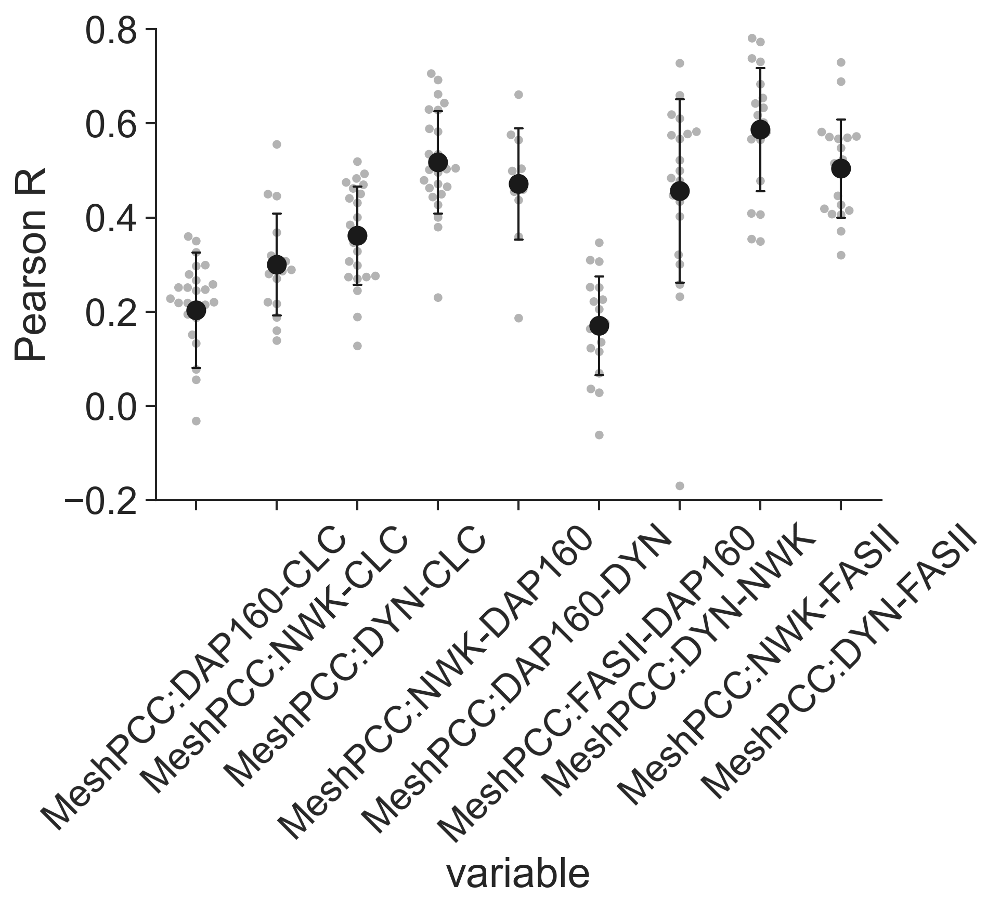

In [10]:
FIG = "Fig 1G-MeshPCC"
# Manually define custom order to display pairwise PCC values
pcc_order = ["DAP160-CLC", "NWK-CLC", "DYN-CLC", "NWK-DAP160", \
              "DAP160-DYN", "FASII-DAP160", "DYN-NWK", "NWK-FASII", "DYN-FASII"]
pcc_order = [f"MeshPCC:{i}" for i in pcc_order]

# Subset out meshPCC measures
meshPCCs = agg.subset_data(CompMeshF_AZ, "MeshPCC", "BRP")
ImgMean = meshPCCs.groupby(["Experiment", "Image"]).mean().reset_index()
ExpMean = meshPCCs.groupby("Experiment").mean().reset_index()

# Melt for plotting
ImgMean=ImgMean.melt(id_vars=["Experiment", "Image"], value_name="Pearson R")
ExpMean=ExpMean.melt(id_vars=["Experiment"], value_name="Pearson R")

# Plot
sp = sns.swarmplot(data=ImgMean, x="variable", y="Pearson R", 
                   size=4, palette=['0.7'], order=pcc_order, hue_order=pcc_order, zorder=0)
#sns.swarmplot(data=ExpMean, x="variable", y="Pearson R", hue="Experiment", size=8, 
#             edgecolor="k", linewidth=1, zorder=0, ax=sp)

sns.pointplot(data=ImgMean, x="variable", y="Pearson R",
              ci='sd', palette=['k'], scale=1.3,
              join=False, capsize=.1, errwidth=1, order=pcc_order, ax=sp)

plt.ylim((-.2,0.8))
plt.xticks(rotation=45)
plt.savefig(os.path.join(savepath, FIG+".svg"))
None

**Do stats on Mesh Pearson**

In [11]:
ImgMean = meshPCCs.groupby(["Experiment", "Image"]).mean().reset_index().drop(["Experiment", "Image"], axis=1)
N_mesh = meshPCCs.groupby("Experiment").count().Image
N_image = (meshPCCs.groupby(["Image"]).count()>0).drop("Experiment", axis=1).sum()
N_exp = meshPCCs.groupby("Experiment").count().Image.count()
analysis = agg.compareGroups(ImgMean)

figs.append(FIG)
tests.append(analysis['test'])
stats.append(analysis['result'][0])
pvals.append(analysis['result'][1])
groups.append(ImgMean.columns.values)
nmeshes.append(N_mesh.values)
nimgs.append(N_image.values)
nexps.append(N_exp)

analysis['posthoc'].to_csv(os.path.join(statspath, FIG+"_Posthoc.csv"))

Performed Kruskal-Wallis: test statistic = 105.22932131656853 p-value:3.629955387148846e-19


In [12]:
stats_summary = pd.DataFrame({"Figure":figs, "Test":tests, "Stat":stats, "P-Val":pvals, 
                              "Groups":groups, "N_Mesh":nmeshes, "N_Img":nimgs, "N_Exp":nexps})
stats_summary.to_excel(os.path.join(statspath, "CompleteStatsSummary.xlsx"))

# S1B - Area distributions

In [13]:
FIG = "Fig S1B-AreaDistributions"
# isolate composite unit areas
CompMeshFarea=CompMeshF.loc[:, ["Experiment", "Area"]]

compAreas = CompMeshFarea.pivot(columns="Experiment")['Area'].reset_index()
compAreas.columns.name = None
compAreas = compAreas.drop("index", axis=1)

AZArea = CompMeshF.loc[CompMeshF.AZcount>0, ["Experiment", "AZcount", "AZareatotal"]]
AZArea["AZareaavg"]=AZArea.AZareatotal/AZArea.AZcount
azAreas = AZArea.pivot(columns="Experiment")['AZareaavg'].reset_index()
azAreas.columns.name = None
azAreas = azAreas.drop("index", axis=1)


In [14]:
print(f'AZ Area Avg: {azAreas.mean().mean()} Std: {azAreas.std().mean()}')

AZ Area Avg: 0.05368358521258564 Std: 0.0213036756291161


In [16]:
print(f'Core area- mean: {CompMeshF.CoreArea.mean()} StdDev: {CompMeshF.CoreArea.std()}')
      
      

Core area- mean: 0.10058904109589056 StdDev: 0.09929806092495816


In [17]:
print(f'Mesh area- mean: {CompMeshF.MeshArea.mean()} StdDev: {CompMeshF.MeshArea.std()}')

Mesh area- mean: 0.23654551922227215 StdDev: 0.09982436030247743


In [18]:
CompMeshF.Area.mean()

0.28728785240830845

In [19]:
# Calculate kde for each composite experiment
compMax=compAreas.max().max()
azMax=azAreas.max().max()
maxmax=np.max([compMax, azMax])
comp_kdes={}
x_test=np.linspace(0, maxmax, 1000)
for col in compAreas:
    y = compAreas.loc[compAreas.loc[:, col]>0, col].to_numpy()
    model = kde(bandwidth=.051) # bandwidth empirically optimized see SD601g
    model.fit(y[:, None])
    log_dens = model.score_samples(x_test[:, None])
    comp_kdes[col] = np.exp(log_dens)
comp_kdes["Area"]=x_test
comp_kdes["Type"]="Comp"
comp_kdes = pd.DataFrame(comp_kdes)

In [20]:
# Calculate kde for each AZ experiment
compMax=compAreas.max().max()
azMax=azAreas.max().max()
maxmax=np.max([compMax, azMax])
az_kdes={}
x_test=np.linspace(0, maxmax, 1000)
for col in azAreas:
    y = azAreas.loc[azAreas.loc[:, col]>0, col].to_numpy()
    model = kde(bandwidth=.051) # bandwidth empirically optimized see SD601g
    model.fit(y[:, None])
    log_dens = model.score_samples(x_test[:, None])
    az_kdes[col] = np.exp(log_dens)
az_kdes["Area"]=x_test
az_kdes["Type"]="AZ"
az_kdes = pd.DataFrame(az_kdes)


In [21]:
# Merge AZ and Comp dataframes
compare_kdes = pd.concat([comp_kdes, az_kdes])
compare_kdes = compare_kdes.melt(id_vars = ["Area", "Type"], value_name="Prob Density")

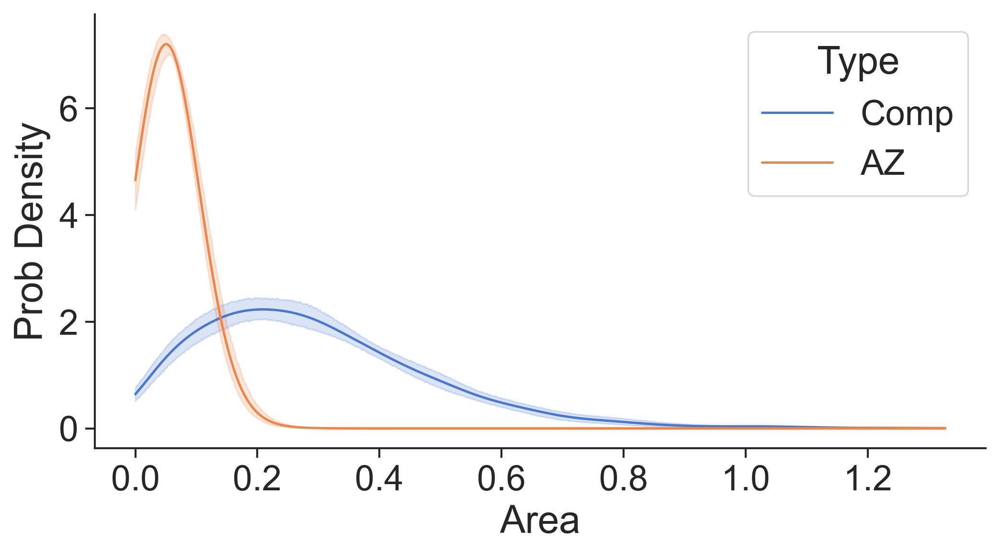

In [22]:
#Plot
lp = sns.lineplot(data=compare_kdes, x="Area", y="Prob Density", hue="Type")
plt.gcf().set_size_inches(8,4)
plt.savefig(os.path.join(savepath, FIG+".svg"))

## S1C - MeshPCC with BRP

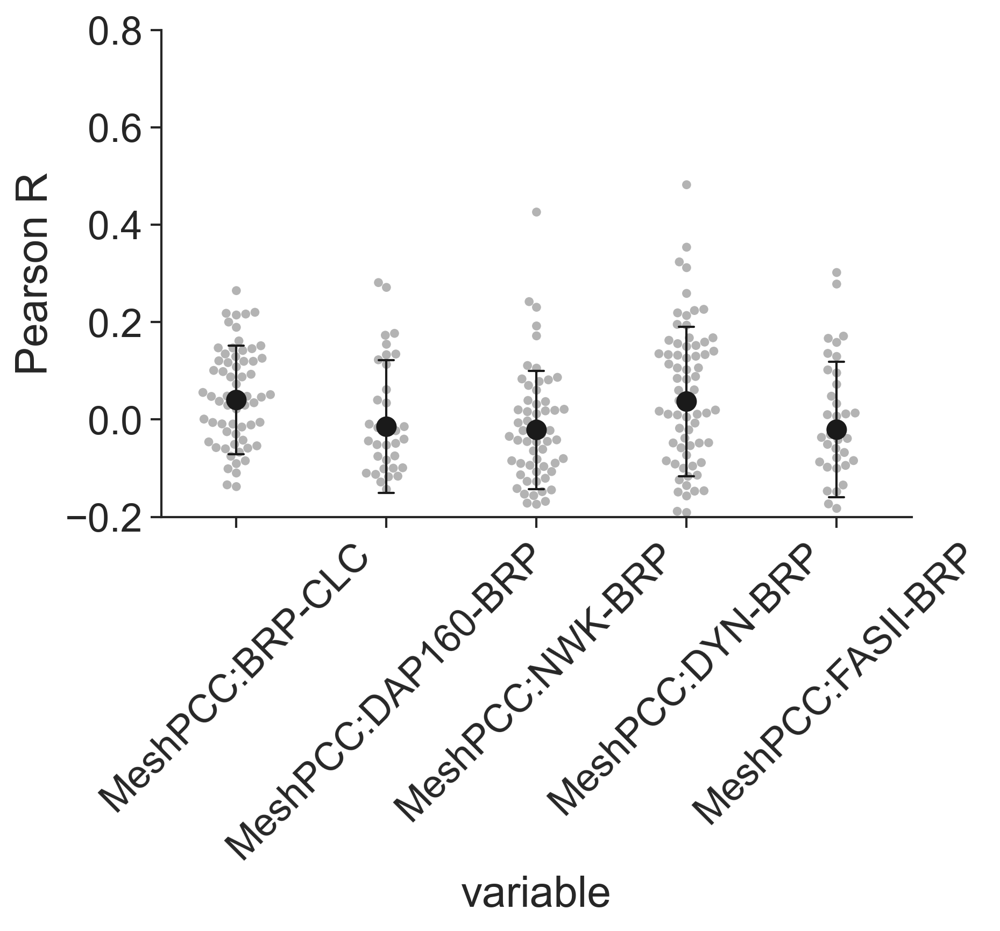

In [23]:
FIG = "Fig S1C-MeshPCC-BRP"
# Manually define custom order to display pairwise PCC values
pcc_order = ["BRP-CLC", "DAP160-BRP", "NWK-BRP", "DYN-BRP", "FASII-BRP"]
pcc_order = [f"MeshPCC:{i}" for i in pcc_order]

# Subset out meshPCC measures
meshPCCs = agg.subset_data(CompMeshF_AZ, "MeshPCC")
ImgMean = meshPCCs.groupby(["Experiment", "Image"]).mean().reset_index()
ExpMean = meshPCCs.groupby("Experiment").mean().reset_index()

# Melt for plotting
ImgMean=ImgMean.melt(id_vars=["Experiment", "Image"], value_name="Pearson R")
ExpMean=ExpMean.melt(id_vars=["Experiment"], value_name="Pearson R")

# Plot
sp = sns.swarmplot(data=ImgMean, x="variable", y="Pearson R", 
                   size=4, palette=['0.7'], order=pcc_order, hue_order=pcc_order, zorder=0)
#sns.swarmplot(data=ExpMean, x="variable", y="Pearson R", hue="Experiment", size=8, 
#             edgecolor="k", linewidth=1, zorder=0, ax=sp)

sns.pointplot(data=ImgMean, x="variable", y="Pearson R",
              ci='sd', palette=['k'], scale=1.3,
              join=False, capsize=.1, errwidth=1, order=pcc_order, ax=sp)

plt.ylim((-.2,0.8))
plt.xticks(rotation=45)
plt.savefig(os.path.join(savepath, FIG+".svg"))
None

## Fig S1D Mesh architecture agreement: Whole NMJ Pearson

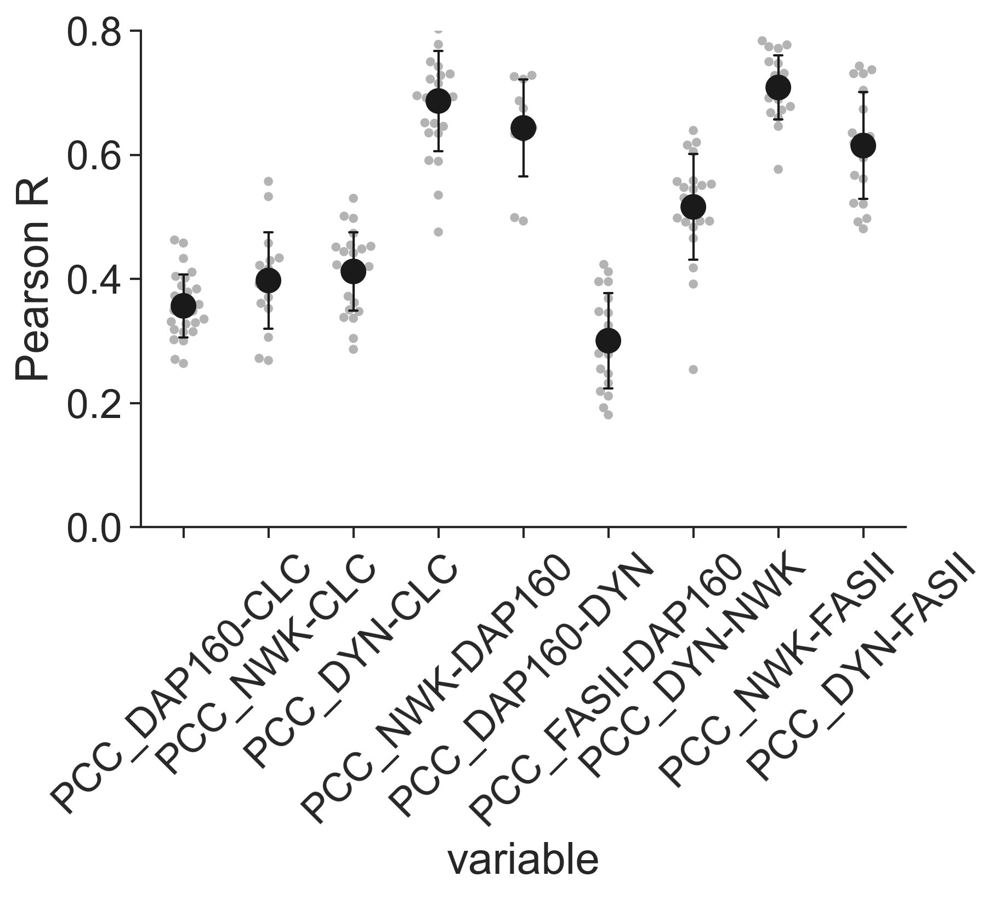

In [24]:
FIG="Fig 1S-D_NMJPCC"
# Make an ordering vector specific to the PCC columns
pcc_order = ["DAP160-CLC", "NWK-CLC", "DYN-CLC", "NWK-DAP160", \
              "DAP160-DYN", "FASII-DAP160", "DYN-NWK", "NWK-FASII", "DYN-FASII"]
pcc_order = [f"PCC_{i}" for i in pcc_order]

ExpMean = wholePCC.groupby("Experiment").mean().reset_index()

# Melt for plotting
ImgMean=wholePCC.melt(id_vars=["Experiment"], value_name="Pearson R")
ExpMean=ExpMean.melt(id_vars=["Experiment"], value_name="Pearson R")


# Plot
sp = sns.swarmplot(data=ImgMean, x="variable", y="Pearson R", 
                   size=4, order=pcc_order, hue_order=pcc_order, palette=['0.7'], zorder=0)
#sns.swarmplot(data=ExpMean, x="variable", y="Pearson R", hue="Experiment", size=8, 
 #             edgecolor="k", linewidth=1, zorder=0, ax=sp)

sns.pointplot(data=ImgMean, x="variable", y="Pearson R",
              ci='sd', palette=['k'], scale=1.6,
              join=False, capsize=.1, errwidth=1, order=pcc_order, ax=sp)

plt.xticks(rotation=45)
plt.ylim((0,0.8))
plt.savefig(os.path.join(savepath, FIG+".svg"))
None

In [25]:
ImgMean = wholePCC.drop("Experiment", axis=1)
analysis = agg.compareGroups(ImgMean)
analysis['posthoc'].to_csv(os.path.join(statspath, FIG+"_Posthoc.csv"))

Performed Kruskal-Wallis: test statistic = 141.46055817746128 p-value:1.1788048104568549e-26


## Fig S1E Mesh architecture agreement: Jaccard Index

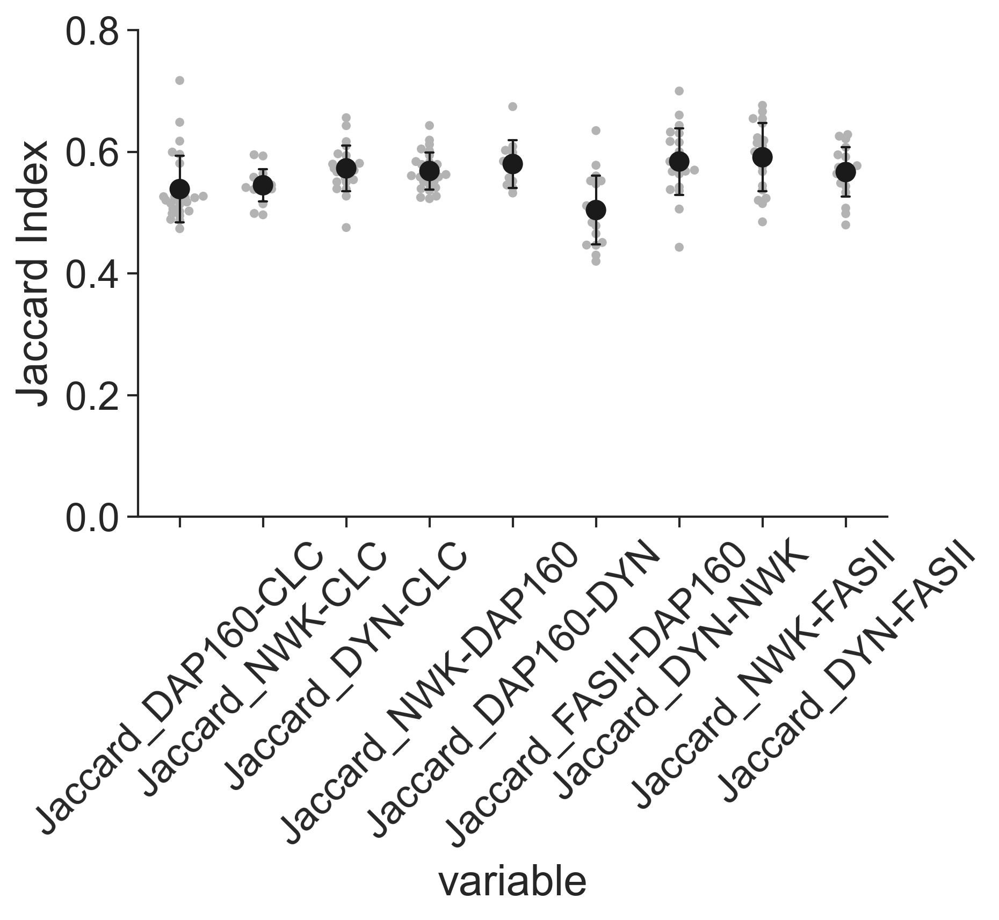

In [26]:
FIG="Fig 1S-E_PAZ_JI"
value="Jaccard Index"

# Isolate jaccard data
wholeJI = agg.subset_pairwiseData(wholeNMJ, "Jaccard")

# Manually define custom order to show pairwise jaccard comparisons
ji_order = ["DAP160-CLC", "NWK-CLC", "DYN-CLC", "NWK-DAP160", \
              "DAP160-DYN", "FASII-DAP160", "DYN-NWK", "NWK-FASII", "DYN-FASII"]
ji_order = [f"Jaccard_{i}" for i in ji_order]

# Plot
ExpMean = wholeJI.groupby("Experiment").mean().reset_index()

# Melt for plotting
ImgMean=wholeJI.melt(id_vars=["Experiment"], value_name=value)
ExpMean=ExpMean.melt(id_vars=["Experiment"], value_name=value)
# Make an ordering vector specific to the MeshRatio columns

# Plot
sp = sns.swarmplot(data=ImgMean, x="variable", y=value, 
                   size=4, order=ji_order, hue_order=ji_order, palette=['0.7'], zorder=0)
#sns.swarmplot(data=ExpMean, x="variable", y="Pearson R", hue="Experiment", size=8, 
 #             edgecolor="k", linewidth=1, zorder=0, ax=sp)

sns.pointplot(data=ImgMean, x="variable", y=value,
              ci='sd', palette=['k'], scale=1.3,
              join=False, capsize=.1, errwidth=1, order=ji_order, ax=sp)

plt.ylim((0,0.8))
plt.xticks(rotation=45)
plt.savefig(os.path.join(savepath, ".svg"))
None

In [27]:
totest = wholeJI.loc[:, ji_order]
analysis = agg.compareGroups(totest)
analysis['posthoc'].to_csv(os.path.join(statspath, FIG+"_Posthoc.csv"))

Performed Kruskal-Wallis: test statistic = 41.240566337760356 p-value:1.8794097072990544e-06


## Fig S1F PAZ centroid agreement

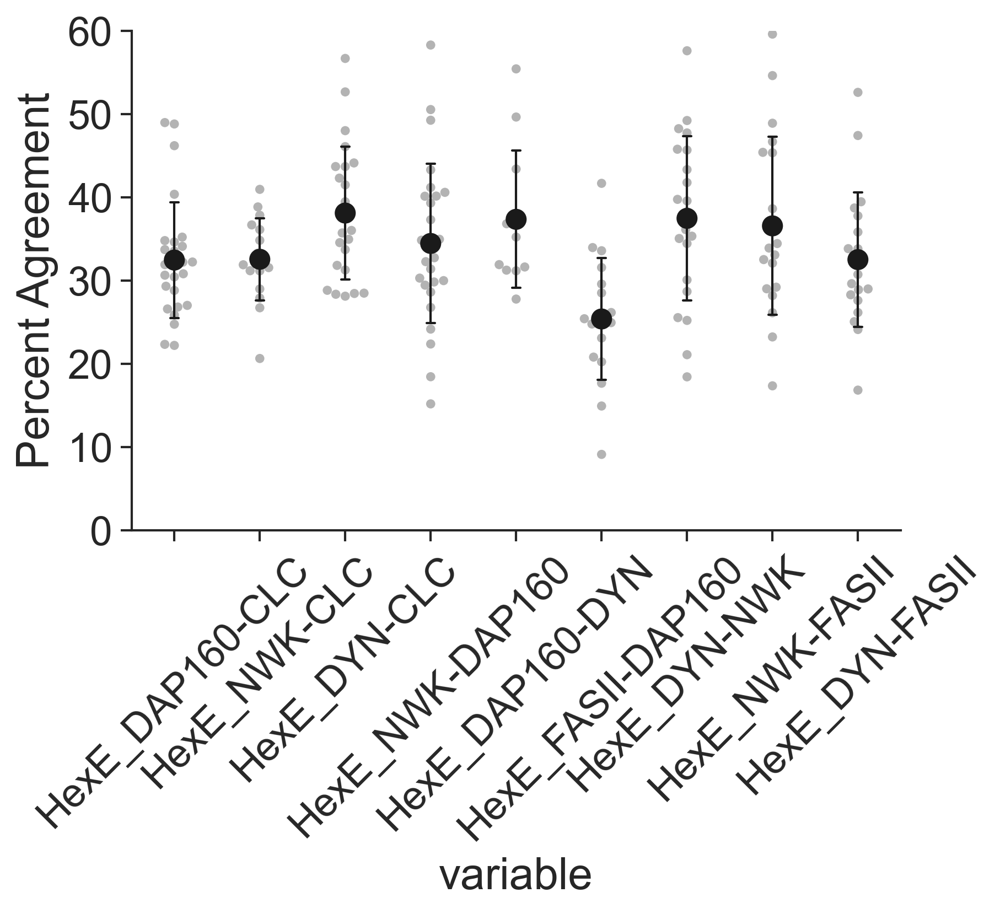

In [28]:
FIG = "Fig 1S-F_NMJ_PAZ-Agreement"
# Load data
error = agg.subset_pairwiseData(wholeNMJ, "Hex")

order = ["DAP160-CLC", "NWK-CLC", "DYN-CLC", "NWK-DAP160", \
              "DAP160-DYN", "FASII-DAP160", "DYN-NWK", "NWK-FASII", "DYN-FASII"]
cols = [f"HexE_{i}" for i in order]

paz_error = error.loc[:, ["Experiment"] + cols]

value="Percent Agreement"

# Plot
ExpMean = paz_error.groupby("Experiment").mean().reset_index()

# Melt for plotting
ImgMean=paz_error.melt(id_vars=["Experiment"], value_name=value)
ExpMean=ExpMean.melt(id_vars=["Experiment"], value_name=value)
# Make an ordering vector specific to the MeshRatio columns

# Plot
sp = sns.swarmplot(data=ImgMean, x="variable", y=value, 
                   size=4, order=cols, palette=['0.7'], zorder=0)
#sns.swarmplot(data=ExpMean, x="variable", y="Pearson R", hue="Experiment", size=8, 
 #             edgecolor="k", linewidth=1, zorder=0, ax=sp)

sns.pointplot(data=ImgMean, x="variable", y=value,
              ci='sd', order=cols, palette=['k'], scale=1.3,
              join=False, capsize=.1, errwidth=1, ax=sp)

plt.ylim((0,60))
plt.xticks(rotation=45)
plt.savefig(os.path.join(savepath, FIG + ".svg"))
None

In [29]:
ImgMean = paz_error.drop("Experiment", axis=1)
analysis = agg.compareGroups(ImgMean)
analysis['posthoc'].to_csv(os.path.join(statspath, FIG + "_Posthoc.csv"))

Performed Kruskal-Wallis: test statistic = 28.911155747186058 p-value:0.00032868460258277636


# Figure 3 Graphs

## Fig 3A Centroid Distributions

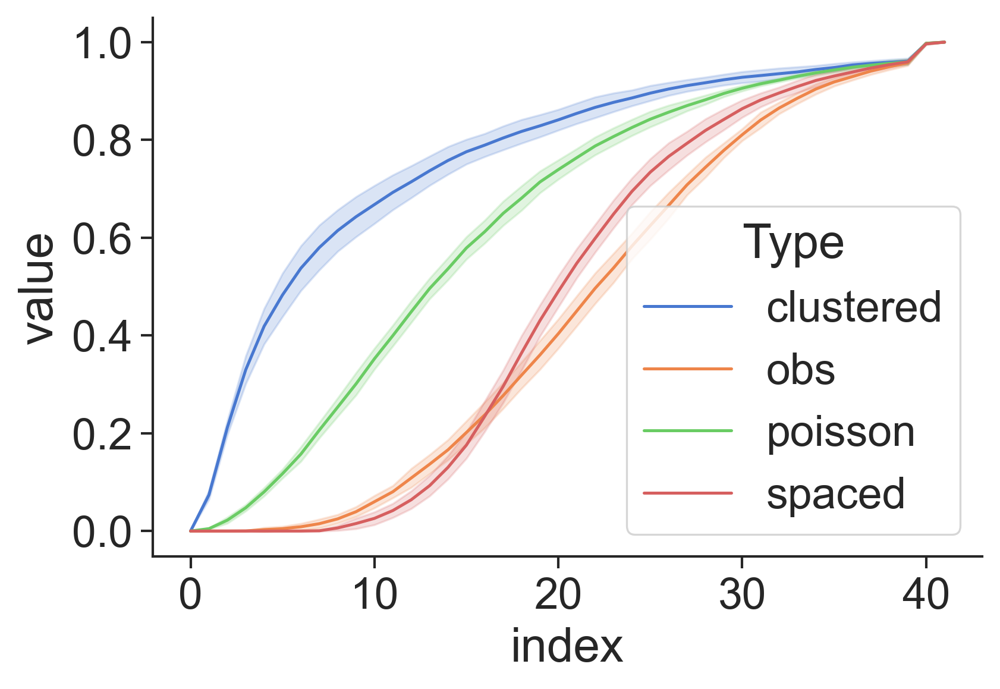

In [30]:

csa = importlib.reload(csa)
# Below takes many minutes to run. If not re-doing analysis just load the saved file below
#allCentroidSet = csa.analyzeCentroidFolder(root_dir)
#allCentroidSet.to_csv("Z:\Current members\DelSignore\PAZ_Project\PAZ_Analyzed_Projections\\allCentroidData.csv")

## Load last run if not re-analyzing
allCentroidSet = pd.read_csv("Z:\Current members\DelSignore\PAZ_Project\PAZ_Analyzed_Projections\\allCentroidData.csv")

allCentMelt = csa.organizeCentroidData(allCentroidSet)

#Plot overall combined mean, unused in final paper probably
csa.plotOverallMean(allCentMelt, savepath=None)

In [33]:
# Maybe for supplemental generate centroids for all the individual meshes. 
#csa.plotIndividualChannels(allCentMelt, savepath=os.path.join(savepath, "Fig S2A_CentroidsByChannel.svg"))

## Figure 2A - Centroid distributions of BRP vs Composite mesh

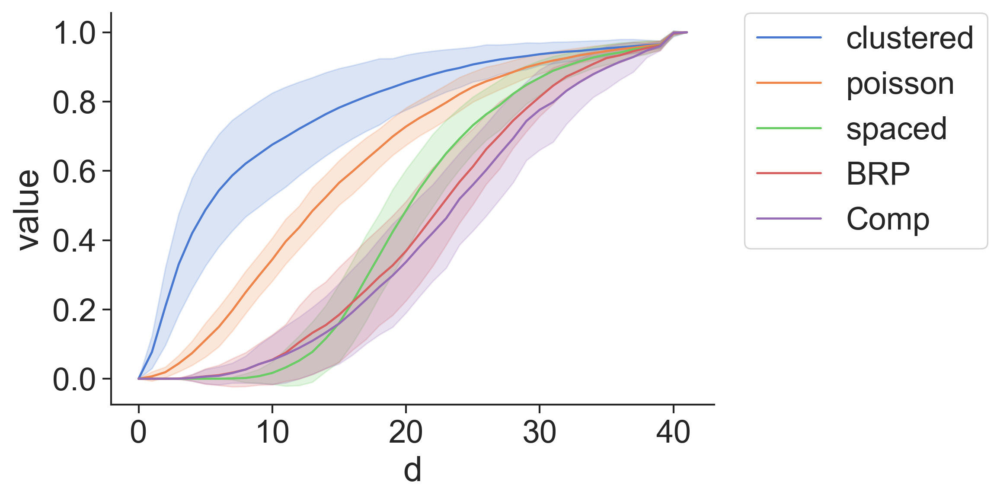

In [34]:
# Make a custom graph comparing model distributions against just composite and BRP for main figure
FIG = "Fig 3B BRP-CompositeSpacing"
ag = allCentroidSet.groupby(axis=1, level=[1,2,3]).mean()
ag.columns.names=["Chan", "Type", "Image"]
am = ag.stack(level=[0, 1]).reset_index()
am.rename(columns={'level_0':'d'}, inplace=True)
am=am.melt(id_vars=["d", "Chan", "Type"])
am.loc[am.Type=='obs', "Type"]=am.Chan[am.Type=='obs']
show = (am.Chan=="BRP") | (am.Chan=="Comp")
order=["clustered", "poisson", "spaced", "BRP", "Comp"]
sp = sns.lineplot(data=am.loc[show, :], x="d", y="value", hue="Type", hue_order=order, ci="sd")
handles, labels = sp.get_legend_handles_labels()
sp.legend(handles, labels, bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.savefig(os.path.join(savepath, FIG + ".svg"))

## Fig 2A example model distributions

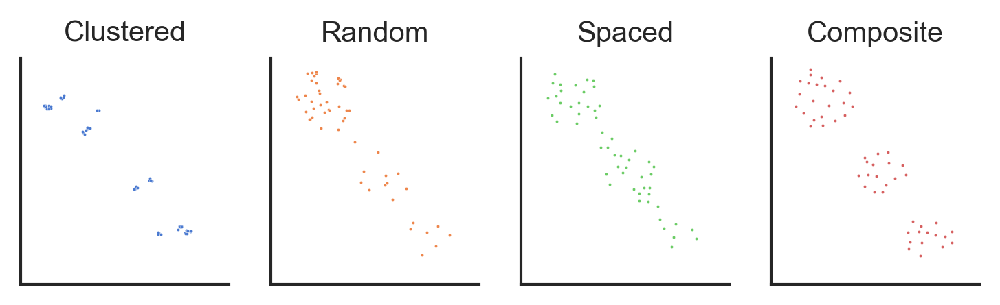

In [35]:
FIG = "Fig 3A_ExampleDistros"
# Choose an example NMJ (pretty randomly, could pick anything)
examplefile='Z:\Current members\DelSignore\PAZ_Project\PAZ_Analyzed_Projections\SD551_NWK_BRP_DAP160\Analysis_V216_SD551\SD551_CentroidData\SD551_5mM_L1_m4_a4__2020_11_08__10_47_57_Out-cleaned-1_MaxZ15-Z23_centroids.csv'
img = tf.imread('Z:\Current members\DelSignore\PAZ_Project\PAZ_Analyzed_Projections\SD551_NWK_BRP_DAP160\SD551_5mM_L1_m4_a4__2020_11_08__10_47_57_Out-cleaned-1_MaxZ15-Z23.tif')
# Load centroids and generate alpha mask
table=pd.read_csv(examplefile)
table.columns = table.columns.str.split("_", expand=True)

# Combine centroids into one list to make alpha shape that describes them cumulatively
allcents = table.unstack()\
    .unstack(level=1)\
    .reset_index()\
    .drop(["level_0", "level_1"], axis=1)\
    .dropna()

# Get merged alpha shape
alpha_shape=libpysal.cg.alpha_shape_auto(allcents.to_numpy())
win = ca.makeWindow(alpha_shape)

# Make model distributions for this image
area = alpha_shape.area
N = table['Comp'].dropna().size//2
obs = table['Comp']
#poisson = pp.PoissonPointProcess(win, N, 10, asPP=True)
matern = ca.MaternPointProcess(win, N, 2, asPP=True).realizations[0]
poisson = pp.PoissonPointProcess(win, N, 1, asPP=True).realizations[0]
cluster = pp.PoissonClusterPointProcess(win, 
                                              N, 
                                              N/5, 
                                              3, 
                                              1, 
                                              asPP=True).realizations[0]

# Make a few representative images to show what clustered, spaced, random, and composite look like
cp=sns.color_palette("muted")
fig, axes = plt.subplots(1,4)
titles = ["Clustered", "Random", "Spaced", "Composite"]
sns.scatterplot(data=cluster.points, x='x', y="y", s=1, color=cp[0], ax=axes[0])
sns.scatterplot(data=poisson.points, x='x', y="y", s=1, color=cp[1], ax=axes[1])
sns.scatterplot(data=matern.points, x='x', y="y", s=1, color=cp[2], ax=axes[2])
sns.scatterplot(data=table.Comp, x='X', y="Y", s=1, color=cp[3], ax=axes[3])
for ax in axes:
    ax.set_xlim(0, img[0].shape[1])
    ax.set_ylim(0, img[0].shape[0])
    ax.set_aspect('equal') 
    ax.set_title(titles.pop(0), fontsize=10)
    ax.set_ylabel("")
    ax.set_xlabel("")
    ax.tick_params(axis='x', bottom=False, labelbottom=False)
    ax.tick_params(axis='y', left=False, labelleft=False)
plt.savefig(os.path.join(savepath, "Fig 2A_ExampleDistros.svg"))

## Fig 3C-Merged BRP-Composite JI graph

c:\Users\sdels\miniconda3\envs\defects\envs\segment_paz\envs\paz_analysis\lib\site-packages\seaborn\categorical.py:1296: UserWarning: 25.7% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
c:\Users\sdels\miniconda3\envs\defects\envs\segment_paz\envs\paz_analysis\lib\site-packages\seaborn\categorical.py:1296: UserWarning: 6.1% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
c:\Users\sdels\miniconda3\envs\defects\envs\segment_paz\envs\paz_analysis\lib\site-packages\seaborn\categorical.py:1296: UserWarning: 7.3% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
c:\Users\sdels\miniconda3\envs\defects\envs\segment_paz\envs\paz_analysis\lib\site-packages\seaborn\categorical.py:1296: UserWarning: 12.8% of the points cannot be placed; you may wan

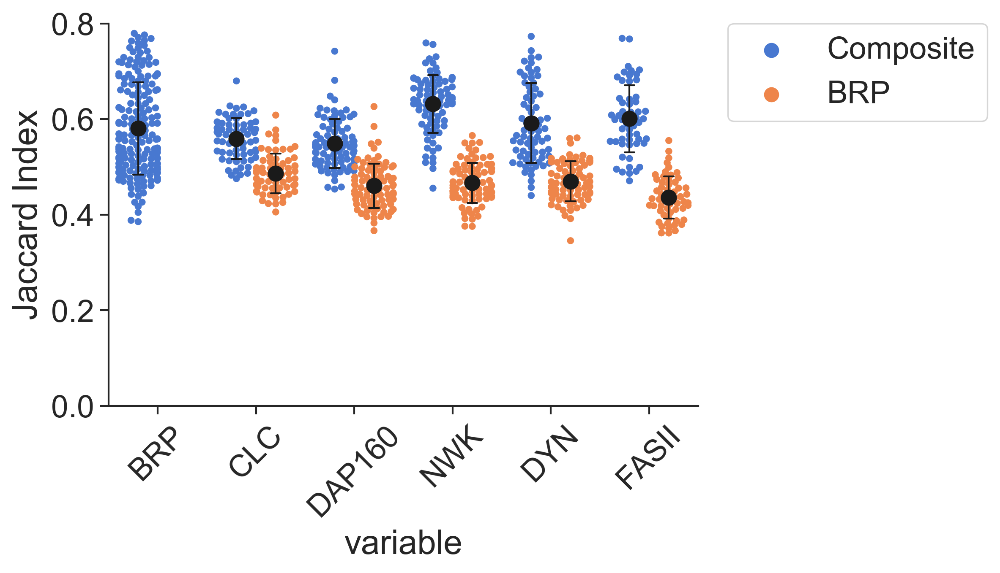

In [36]:
FIG = "Fig 3_CompVsBRP_JI"
compcol = [col for col in wholeJI.columns if "Composite" in col]

newcol = [col.replace("-", "_").split("_") for col in compcol]
for col in newcol: 
    col.remove('Jaccard')
    col.remove('Composite')
newcol = [col[0] for col in newcol]

# Get composite ji data & relabel columns
compji = wholeJI.loc[:, compcol]
compji.columns=newcol
compji["Experiment"]=wholeJI.Experiment

# Merge split columns
def sjoin(x): return x[x.notnull()]
compji = compji.groupby(level=0, axis=1).apply(lambda x: x.apply(sjoin, axis=1))


# Get columns for just the brp comparisons
brpcol = [col for col in wholeJI.columns if ("BRP" in col)]
newcol = [col.replace("-", "_").split("_") for col in brpcol]
for col in newcol: 
    col.remove('Jaccard')
    col.remove('BRP')
newcol = [col[0] for col in newcol]

# Get brp ji data & relabel columns
brpji = wholeJI.loc[:, brpcol]
brpji.columns=newcol
brpji["Experiment"]=wholeJI.Experiment

# Merge split columns
def sjoin(x): return x[x.notnull()]
brpji = brpji.groupby(level=0, axis=1).apply(lambda x: x.apply(sjoin, axis=1))
brpji.columns = brpji.columns.droplevel()

# Label individual datasets
compji["Type"]="Composite"
brpji["Type"]="BRP"

compare_brp_Composite = pd.concat([compji, brpji])

## PLOT ##
# Define custom order for composite JI
ji_order = ["BRP", "CLC", "DAP160", "NWK", "DYN", "FASII"]
value="Jaccard Index"
data = compare_brp_Composite

ExpMean = data.groupby(["Experiment", "Type"]).mean().reset_index()

# Melt for plotting
ImgMean=data.melt(id_vars=["Experiment", "Type"], value_name=value)
ExpMean=ExpMean.melt(id_vars=["Experiment", "Type"], value_name=value)

# Plot
sp = sns.swarmplot(data=ImgMean, x="variable", y=value, hue="Type", 
                   dodge=True, size=4, order=ji_order, zorder=0)
#sns.swarmplot(data=ExpMean, x="variable", y="Pearson R", hue="Experiment", size=8, 
 #             edgecolor="k", linewidth=1, zorder=0, ax=sp)

sns.pointplot(data=ImgMean, x="variable", y=value, hue="Type",
              ci='sd', palette=['k'], scale=1.3, dodge=.4,
              join=False, capsize=.1, errwidth=1, order=ji_order, ax=sp)

handles, labels = sp.get_legend_handles_labels()
n = len(handles)//2

l = plt.legend(handles[0:n], labels[0:n], bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.ylim((0,0.8))
plt.xticks(rotation=45)
plt.savefig(os.path.join(savepath, FIG + ".svg"))
None

In [37]:
totest = data.drop(["Experiment", "Composite"], axis=1)
totest = totest.melt(id_vars="Type")
totest["Group"]=totest.Type+"-"+totest.variable
#ImgMean = ImgMean.pivot(columns = 'Type', values=ImgMean.columns.drop('Type'))
#ImgMean.columns.names=[None, None]
#ImgMean.to_excel(os.path.join(statspath, "TEMP-COmp-BRP_JI.xlsx"))
totest=totest.drop(["Type", "variable"], axis=1)
totest=totest.pivot(columns="Group", values="value")
totest.to_excel(os.path.join(statspath, "TEMP-COmp-BRP_JI.xlsx"))

## Fig 3D BRP-Composite Centroid Agreement

c:\Users\sdels\miniconda3\envs\defects\envs\segment_paz\envs\paz_analysis\lib\site-packages\seaborn\categorical.py:1296: UserWarning: 36.9% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
c:\Users\sdels\miniconda3\envs\defects\envs\segment_paz\envs\paz_analysis\lib\site-packages\seaborn\categorical.py:1296: UserWarning: 11.2% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
c:\Users\sdels\miniconda3\envs\defects\envs\segment_paz\envs\paz_analysis\lib\site-packages\seaborn\categorical.py:1296: UserWarning: 10.1% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
c:\Users\sdels\miniconda3\envs\defects\envs\segment_paz\envs\paz_analysis\lib\site-packages\seaborn\categorical.py:1296: UserWarning: 7.8% of the points cannot be placed; you may wa

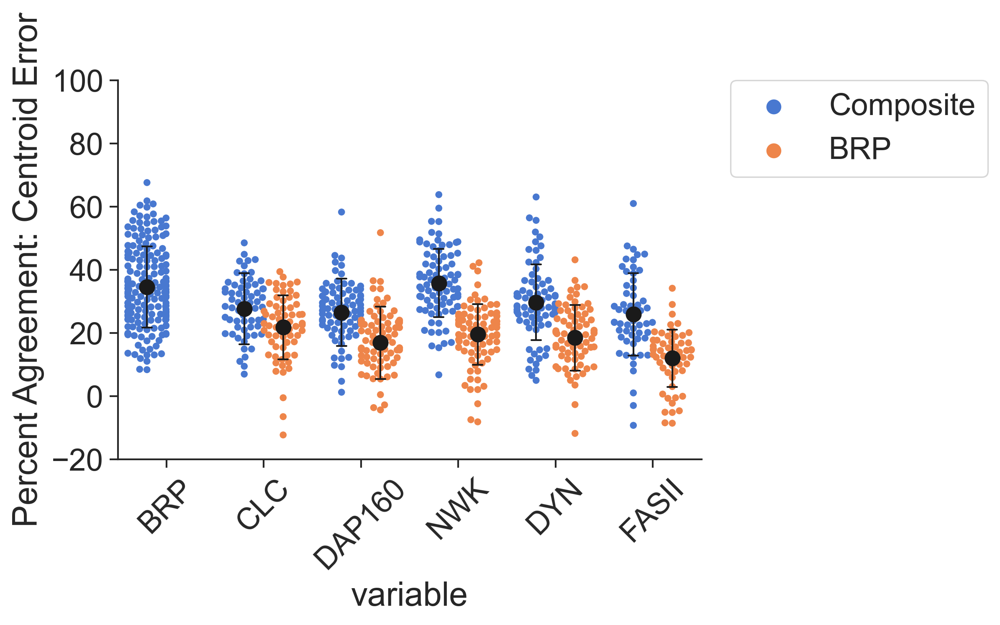

In [38]:
FIG = 'Fig 3D_CompVsBRP_Error'

# Get columns for just the composite comparisons
compcol = [col for col in error.columns if "Composite" in col]
newcol = [col.replace("-", "_").split("_") for col in compcol]
for col in newcol: 
    col.remove('HexE')
    col.remove('Composite')
newcol = [col[0] for col in newcol]

# Get composite data & relabel columns
comperror = error.loc[:, compcol]
comperror.columns=newcol
comperror["Experiment"]=error.Experiment

# Merge split columns
def sjoin(x): return x[x.notnull()]
comperror = comperror.groupby(level=0, axis=1).apply(lambda x: x.apply(sjoin, axis=1))

# Get columns for just the brp comparisons
brpcol = [col for col in error.columns if ("BRP" in col)]
newcol = [col.replace("-", "_").split("_") for col in brpcol]
for col in newcol: 
    col.remove('HexE')
    col.remove('BRP')
newcol = [col[0] for col in newcol]

# Get brp error data & relabel columns
brperror = error.loc[:, brpcol]
brperror.columns=newcol
brperror["Experiment"]=error.Experiment

# Merge split columns
def sjoin(x): return x[x.notnull()]
brperror = brperror.groupby(level=0, axis=1).apply(lambda x: x.apply(sjoin, axis=1))
brperror.columns = brperror.columns.droplevel()

comperror["Type"]="Composite"
brperror["Type"]="BRP"

compareErrors = pd.concat([comperror, brperror])

## PLOT ##
# Define custom order for composite JI
ji_order = ["BRP", "CLC", "DAP160", "NWK", "DYN", "FASII"]
value="Percent Agreement: Centroid Error"
data = compareErrors

ExpMean = data.groupby(["Experiment", "Type"]).mean().reset_index()

# Melt for plotting
ImgMean=data.melt(id_vars=["Experiment", "Type"], value_name=value)
ExpMean=ExpMean.melt(id_vars=["Experiment", "Type"], value_name=value)

# Plot
sp = sns.swarmplot(data=ImgMean, x="variable", y=value, hue="Type", 
                   dodge=True, size=4, order=ji_order, zorder=0)
#sns.swarmplot(data=ExpMean, x="variable", y="Pearson R", hue="Experiment", size=8, 
 #             edgecolor="k", linewidth=1, zorder=0, ax=sp)

sns.pointplot(data=ImgMean, x="variable", y=value, hue="Type",
              ci='sd', palette=['k'], scale=1.3, dodge=.4,
              join=False, capsize=.1, errwidth=1, order=ji_order, ax=sp)

handles, labels = sp.get_legend_handles_labels()
n = len(handles)//2

l = plt.legend(handles[0:n], labels[0:n], bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.ylim((-20, 100))
plt.xticks(rotation=45)
plt.savefig(os.path.join(savepath, FIG + ".svg"))
None

In [39]:
totest = data.drop(["Experiment", "Composite"], axis=1)
totest = totest.melt(id_vars="Type")
totest["Group"]=totest.Type+"-"+totest.variable
#ImgMean = ImgMean.pivot(columns = 'Type', values=ImgMean.columns.drop('Type'))
#ImgMean.columns.names=[None, None]
#ImgMean.to_excel(os.path.join(statspath, "TEMP-COmp-BRP_JI.xlsx"))
totest=totest.drop(["Type", "variable"], axis=1)
totest=totest.pivot(columns="Group", values="value")
totest.to_excel(os.path.join(statspath, "TEMP-Comp-BRP_CentError.xlsx"))


## Fig 3D-E Area distributions

**Organize AZ vs Composite mesh area data**

In [40]:
# Subet area data
CompMeshFarea=CompMeshF.loc[:, ["Experiment", "Area"]]
AZMeshFarea=AZMeshF.loc[:, ["Experiment", "Area"]]
compAreas = CompMeshFarea.pivot(columns="Experiment")['Area'].reset_index()
compAreas.columns.name = None
compAreas = compAreas.drop("index", axis=1)

azAreas = AZMeshFarea.pivot(columns="Experiment")['Area'].reset_index()
azAreas.columns.name = None
azAreas = azAreas.drop("index", axis=1)

**Set up KDE**

In [41]:
# Optimize bandwidth
bandwidths = 10 ** np.linspace(-2, 1, 100)
grid = GridSearchCV(kde(kernel='gaussian'),
                    {'bandwidth': bandwidths},
                    cv=LeaveOneOut())

opt_band = {}
for col in compAreas:
    y = compAreas.loc[compAreas.loc[:, col]>0, col].to_numpy()
    grid.fit(y[:, None]);
    opt_band[col]=grid.best_params_

# get simple array of bandwidths for each experiment
bws=np.array([x['bandwidth'] for x in opt_band.values()])

# Determine the highest value of area across all datasets to set range for analysis
compMax=compAreas.max().max()
azMax=azAreas.max().max()
maxmax=np.max([compMax, azMax])

# x_test is the test x values to use in calculating KDE
x_test=np.linspace(0, maxmax, 1000)

**Calculate KDE for each experiment in Composite and AZ mesh datasets**

In [42]:
FIG = "AreaKDE"
comp_dens=pd.DataFrame()
for col in compAreas:
    y = compAreas.loc[compAreas.loc[:, col]>0, col].to_numpy()
    model = kde(bandwidth=bws.mean())
    model.fit(y[:, None])
    log_dens = model.score_samples(x_test[:, None])
    comp_dens[col] = np.exp(log_dens)
comp_dens["Area"]=x_test
comp_dens["Type"]="Comp"

az_dens=pd.DataFrame()

for col in azAreas:
    y = azAreas.loc[azAreas.loc[:, col]>0, col].to_numpy()
    model = kde(bandwidth=bws.mean())
    model.fit(y[:, None])
    log_dens = model.score_samples(x_test[:, None])
    az_dens[col] = np.exp(log_dens)
az_dens["Area"]=x_test
az_dens["Type"]="AZ"

# Merge AZ and Comp dataframes
compare_dens = pd.concat([comp_dens, az_dens])
compare_dens = compare_dens.melt(id_vars = ["Area", "Type"], value_name="Probability Density")

<AxesSubplot:xlabel='Area', ylabel='Probability Density'>

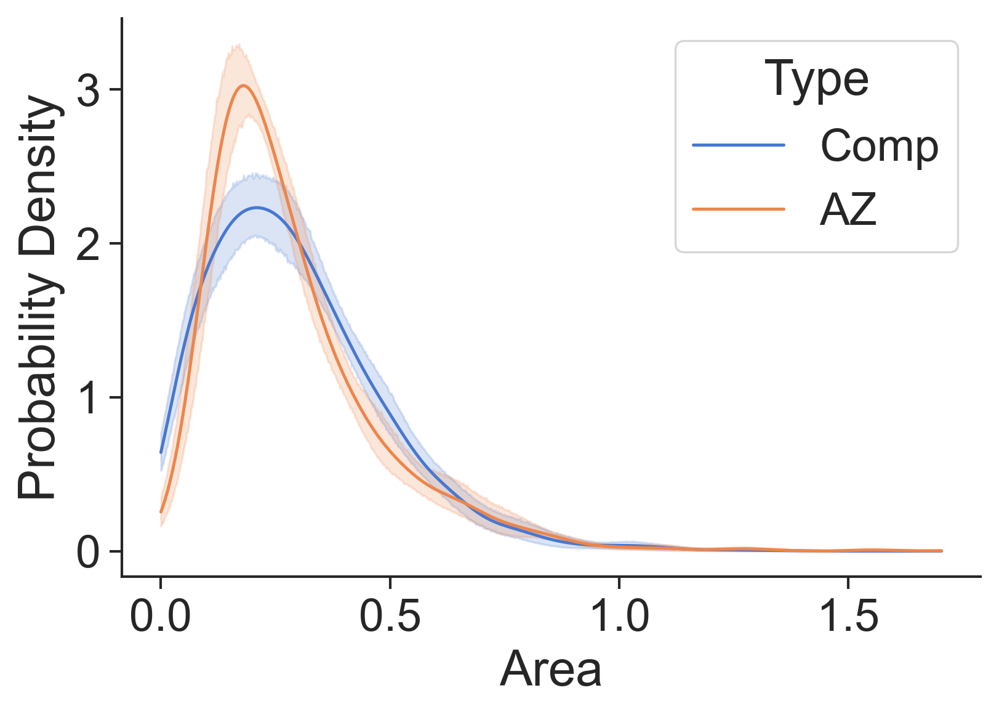

In [43]:
sns.lineplot(data=compare_dens, x="Area", y="Probability Density", hue="Type")

## Fig 3E - Area by n AZ kde

**Look at distributions for AZ=0,1,2,3 for composite:**

In [44]:
FIG = "Fig 3F_AreaKDEByAZ"
CompMeshFarea=CompMeshF.loc[:, ["Experiment", "Area", "AZcount"]]

# Make a new dataframe holding probability densities for each of 0-3 az meshes
Densities_By_AZ = pd.DataFrame()
for nAZ in range(4):
    temp = CompMeshFarea.loc[CompMeshFarea.AZcount==nAZ, ["Experiment", "Area"]]
    temp = temp.pivot(columns="Experiment")
    temp.columns = temp.columns.droplevel(0)
    dens=pd.DataFrame()
    for col in temp:
        y = temp.loc[temp.loc[:, col]>0, col].to_numpy()
        model = kde(bandwidth=bws.mean())
        model.fit(y[:, None])
        log_dens = model.score_samples(x_test[:, None])
        dens[col] = np.exp(log_dens)
    dens["nAZ"] = nAZ
    dens["Area"] = x_test
    Densities_By_AZ = pd.concat((Densities_By_AZ, dens))
Densities_By_AZ = Densities_By_AZ.melt(id_vars = ["Area", "nAZ"], value_name="Probability Density")

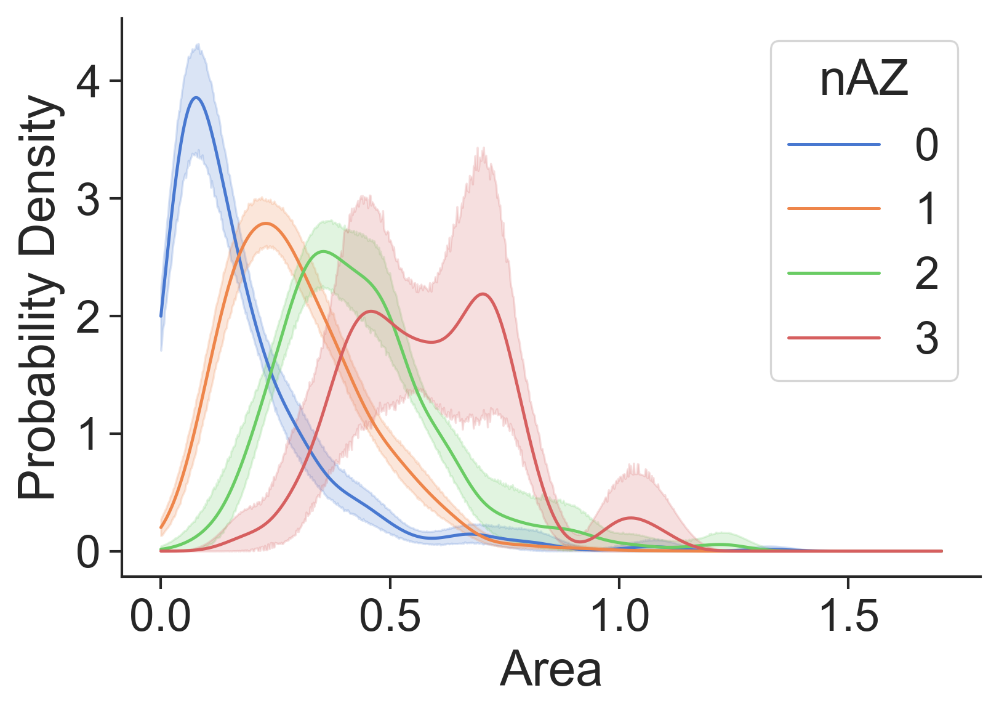

In [45]:
sns.lineplot(data=Densities_By_AZ, x="Area", y="Probability Density", palette=c_palette, hue="nAZ")
plt.savefig(os.path.join(savepath, FIG + ".svg"))

## Fig 3F- Area by N AZ swarmplot

c:\Users\sdels\miniconda3\envs\defects\envs\segment_paz\envs\paz_analysis\lib\site-packages\seaborn\categorical.py:1296: UserWarning: 19.6% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
c:\Users\sdels\miniconda3\envs\defects\envs\segment_paz\envs\paz_analysis\lib\site-packages\seaborn\categorical.py:1296: UserWarning: 30.8% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
c:\Users\sdels\miniconda3\envs\defects\envs\segment_paz\envs\paz_analysis\lib\site-packages\seaborn\categorical.py:1296: UserWarning: 5.9% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


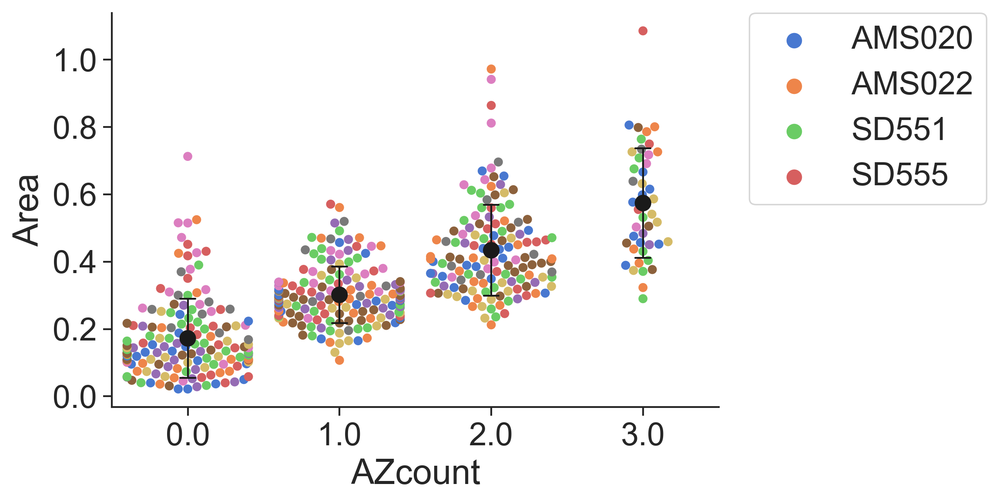

In [46]:
FIG = "Fig 3F_CompositeAreaByAZNumSwarm"
CompMeshFarea=CompMeshF.loc[:, ["Experiment", "Area", "Image", "AZcount"]]
CompMeshByAZ = CompMeshFarea.groupby(["Experiment", "Image", "AZcount"]).mean().reset_index()
data = CompMeshByAZ.loc[CompMeshByAZ.AZcount<4, :]
sp = sns.swarmplot(data=data, x="AZcount", y="Area", hue="Experiment", zorder=0)
sns.pointplot(data=data, x="AZcount", y="Area", 
              ci='sd', palette=['k'], scale=1.3, join=False, capsize=.1, errwidth=1, ax=sp)
handles, labels = sp.get_legend_handles_labels()
n = len(handles)//2
l = plt.legend(handles[0:n], labels[0:n], bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.savefig(os.path.join(savepath, FIG+".svg"))

In [47]:
totest = data.groupby(["AZcount", "Image"]).mean().reset_index().drop("Image", axis=1).pivot(columns="AZcount").droplevel(level = 0, axis=1)
totest.columns.name = None
analysis = agg.compareGroups(totest)
analysis['posthoc'].to_csv(os.path.join(statspath, FIG + "_Posthoc.csv"))

Performed Kruskal-Wallis: test statistic = 289.5647273222862 p-value:1.8035301250586466e-62


## Fig S3B Centroid Error BRP

c:\Users\sdels\miniconda3\envs\defects\envs\segment_paz\envs\paz_analysis\lib\site-packages\seaborn\categorical.py:1296: UserWarning: 6.7% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


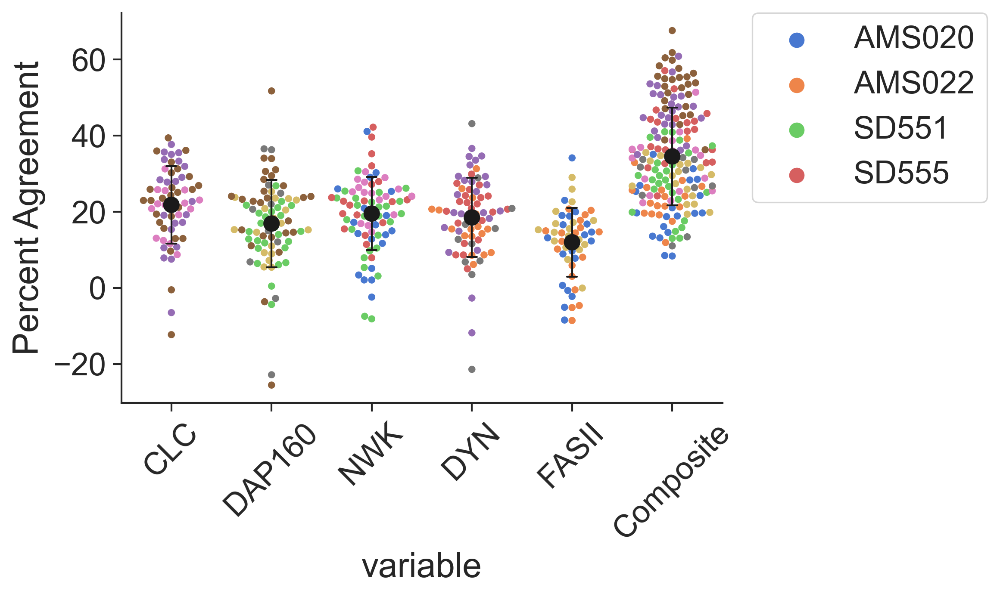

In [48]:
FIG = "Fig 3SB_CentroidAgreement_BRP"
# Get columns for just the brp comparisons
brpcol = [col for col in error.columns if ("BRP" in col)]
newcol = [col.replace("-", "_").split("_") for col in brpcol]
for col in newcol: 
    col.remove('HexE')
    col.remove('BRP')
newcol = [col[0] for col in newcol]

# Get brp error data & relabel columns
brperror = error.loc[:, brpcol]
brperror.columns=newcol
brperror["Experiment"]=error.Experiment

# Merge split columns
def sjoin(x): return x[x.notnull()]
brperror = brperror.groupby(level=0, axis=1).apply(lambda x: x.apply(sjoin, axis=1))
brperror.columns = brperror.columns.droplevel()

order = ["CLC", "DAP160", "NWK", "DYN", "FASII", "Composite"]
value="Percent Agreement"
data = brperror


### Plot ###
ExpMean = data.groupby("Experiment").mean().reset_index()

# Melt for plotting
ImgMean=data.melt(id_vars=["Experiment"], value_name=value)
ExpMean=ExpMean.melt(id_vars=["Experiment"], value_name=value)

# Plot
sp = sns.swarmplot(data=ImgMean, x="variable", y=value, 
                   size=4, order=order, hue="Experiment", zorder=0)
#sns.swarmplot(data=ExpMean, x="variable", y="Pearson R", hue="Experiment", size=8, 
 #             edgecolor="k", linewidth=1, zorder=0, ax=sp)

sns.pointplot(data=ImgMean, x="variable", y=value,
              ci='sd', palette=['k'], scale=1.3,
              join=False, capsize=.1, errwidth=1, order=order, ax=sp)

handles, labels = sp.get_legend_handles_labels()
n = len(handles)//2

l = plt.legend(handles[0:n], labels[0:n], bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
#plt.ylim((0,100))
plt.xticks(rotation=45)
plt.savefig(os.path.join(savepath, FIG + ".svg"))
None

In [49]:
ImgMean = brperror.drop("Experiment", axis=1)
analysis = agg.compareGroups(ImgMean)
analysis['posthoc'].to_csv(os.path.join(statspath, FIG + "_Posthoc.csv"))

Performed Kruskal-Wallis: test statistic = 191.03616234451465 p-value:2.3459495415615943e-39


In [50]:
ImgMean

,CLC,Composite,DAP160,DYN,FASII,NWK
0,NaN,14.55294,NaN,NaN,-0.70411,5.11242
1,NaN,8.36134,NaN,NaN,-2.25979,14.97585
2,NaN,13.13828,NaN,NaN,8.89414,2.06290
3,NaN,18.71833,NaN,NaN,-5.11094,14.27081
4,NaN,28.33898,NaN,NaN,22.99186,25.33641
...,...,...,...,...,...,...
13,NaN,32.74694,15.29119,NaN,13.62013,NaN
14,NaN,21.98953,5.40802,NaN,17.18423,NaN
15,NaN,27.38514,18.23480,NaN,14.59040,NaN
16,NaN,29.74313,10.99076,NaN,22.60079,NaN


## Fig S3A Jaccard between BRP and other meshes

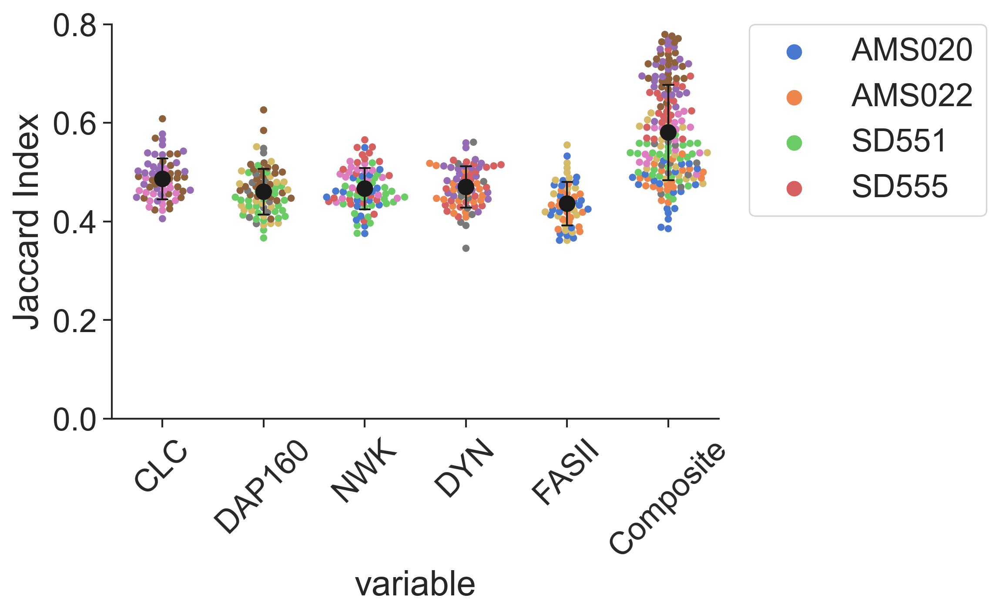

In [51]:
FIG = "Fig 3S-A_BRP-Jaccard"
# Get columns for just the brp comparisons
brpcol = [col for col in wholeJI.columns if ("BRP" in col)]
newcol = [col.replace("-", "_").split("_") for col in brpcol]
for col in newcol: 
    col.remove('Jaccard')
    col.remove('BRP')
newcol = [col[0] for col in newcol]

# Get brp ji data & relabel columns
brpji = wholeJI.loc[:, brpcol]
brpji.columns=newcol
brpji["Experiment"]=wholeJI.Experiment

# Merge split columns
def sjoin(x): return x[x.notnull()]
brpji = brpji.groupby(level=0, axis=1).apply(lambda x: x.apply(sjoin, axis=1))
brpji.columns = brpji.columns.droplevel()

## PLOT ##
# Define custom order to display JI between BRP and other meshes
ji_order = ["CLC", "DAP160", "NWK", "DYN", "FASII", "Composite"]
value="Jaccard Index"
data = brpji

ExpMean = data.groupby("Experiment").mean().reset_index()

# Melt for plotting
ImgMean=data.melt(id_vars=["Experiment"], value_name=value)
ExpMean=ExpMean.melt(id_vars=["Experiment"], value_name=value)

# Plot
sp = sns.swarmplot(data=ImgMean, x="variable", y=value, 
                   size=4, order=ji_order, hue="Experiment", zorder=0)
#sns.swarmplot(data=ExpMean, x="variable", y="Pearson R", hue="Experiment", size=8, 
 #             edgecolor="k", linewidth=1, zorder=0, ax=sp)

sns.pointplot(data=ImgMean, x="variable", y=value,
              ci='sd', palette=['k'], scale=1.3,
              join=False, capsize=.1, errwidth=1, order=ji_order, ax=sp)

handles, labels = sp.get_legend_handles_labels()
n = len(handles)//2

l = plt.legend(handles[0:n], labels[0:n], bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.ylim((0,0.8))
plt.xticks(rotation=45)
plt.savefig(os.path.join(savepath, FIG + ".svg"))
None

In [52]:
ImgMean = brpji.drop("Experiment", axis=1)
analysis = agg.compareGroups(ImgMean)
analysis['posthoc'].to_csv(os.path.join(statspath, FIG + "_Posthoc.csv"))

Performed Kruskal-Wallis: test statistic = 210.60626611334934 p-value:1.5262569366892276e-43


## Fig S3C Jaccard between composite and other meshes

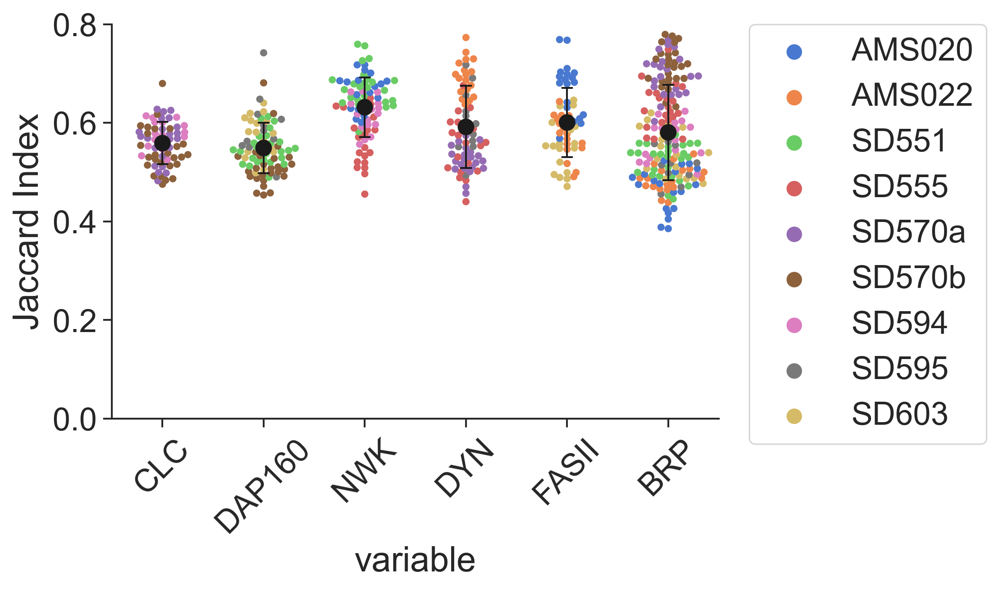

In [53]:
FIG = "Fig 3SC_Composite_JI"
# Get columns for just the composite comparisons
compcol = [col for col in wholeJI.columns if "Composite" in col]
newcol = [col.replace("-", "_").split("_") for col in compcol]
for col in newcol: 
    col.remove('Jaccard')
    col.remove('Composite')
newcol = [col[0] for col in newcol]

# Get composite ji data & relabel columns
compji = wholeJI.loc[:, compcol]
compji.columns=newcol
compji["Experiment"]=wholeJI.Experiment

# Merge split columns
def sjoin(x): return x[x.notnull()]
compji = compji.groupby(level=0, axis=1).apply(lambda x: x.apply(sjoin, axis=1))

## PLOT ##
# Define custom order for composite JI
ji_order = ["CLC", "DAP160", "NWK", "DYN", "FASII", "BRP"]
value="Jaccard Index"
data = compji

ExpMean = data.groupby("Experiment").mean().reset_index()

# Melt for plotting
ImgMean=data.melt(id_vars=["Experiment"], value_name=value)
ExpMean=ExpMean.melt(id_vars=["Experiment"], value_name=value)

# Plot
sp = sns.swarmplot(data=ImgMean, x="variable", y=value, hue="Experiment", 
                   size=4, order=ji_order, zorder=0)
#sns.swarmplot(data=ExpMean, x="variable", y="Pearson R", hue="Experiment", size=8, 
 #             edgecolor="k", linewidth=1, zorder=0, ax=sp)

sns.pointplot(data=ImgMean, x="variable", y=value,
              ci='sd', palette=['k'], scale=1.3,
              join=False, capsize=.1, errwidth=1, order=ji_order, ax=sp)

handles, labels = sp.get_legend_handles_labels()
n = len(handles)//2

l = plt.legend(handles[0:], labels[0:], bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.ylim((0,0.8))
plt.xticks(rotation=45)
plt.savefig(os.path.join(savepath, FIG+".svg"))
None

In [54]:
ImgMean = compji.drop("Experiment", axis=1)
analysis = agg.compareGroups(ImgMean)
analysis['posthoc'].to_csv(os.path.join(statspath, FIG + "_Posthoc.csv"))

Performed Kruskal-Wallis: test statistic = 60.46324260836038 p-value:9.74977347245931e-12


## Fig S3D Centroid Agreement Composite

,NWK,FASII,BRP,DYN,DAP160,CLC,Experiment,Type
0,30.95447,13.51308,14.55294,NaN,NaN,NaN,AMS020,Composite
1,33.35927,20.60104,8.36134,NaN,NaN,NaN,AMS020,Composite
2,15.30926,20.85859,13.13828,NaN,NaN,NaN,AMS020,Composite
3,27.09836,12.95393,18.71833,NaN,NaN,NaN,AMS020,Composite
4,49.37757,44.95331,28.33898,NaN,NaN,NaN,AMS020,Composite
...,...,...,...,...,...,...,...,...
13,NaN,12.91955,32.74694,NaN,23.39757,NaN,SD603,Composite
14,NaN,12.94563,21.98953,NaN,4.68915,NaN,SD603,Composite
15,NaN,21.40969,27.38514,NaN,33.94484,NaN,SD603,Composite
16,NaN,28.51723,29.74313,NaN,23.70561,NaN,SD603,Composite


c:\Users\sdels\miniconda3\envs\defects\envs\segment_paz\envs\paz_analysis\lib\site-packages\seaborn\categorical.py:1296: UserWarning: 6.7% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


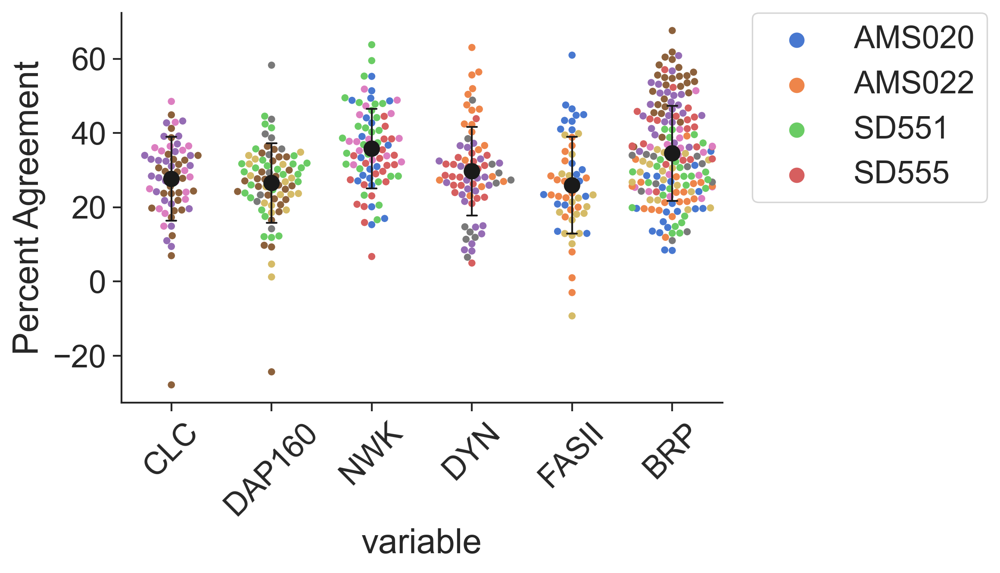

In [59]:
FIG = 'Fig 3SD_CentroidAgreement_Composite'
# Get columns for just the composite comparisons

data = comperror.drop(["Type"], axis=1)
value = "Percent Agreement"
order = ["CLC", "DAP160", "NWK", "DYN", "FASII", "BRP"]

# Plot
ExpMean = data.groupby("Experiment").mean().reset_index()

# Melt for plotting
ImgMean=data.melt(id_vars=["Experiment"], value_name=value)
ExpMean=ExpMean.melt(id_vars=["Experiment"], value_name=value)

# Plot
sp = sns.swarmplot(data=ImgMean, x="variable", y=value, 
                   hue="Experiment", size=4, order=order, zorder=0)
#sns.swarmplot(data=ExpMean, x="variable", y="Pearson R", hue="Experiment", size=8, 
 #             edgecolor="k", linewidth=1, zorder=0, ax=sp)

sns.pointplot(data=ImgMean, x="variable", y=value,
              ci='sd', palette=['k'], scale=1.3,
              join=False, capsize=.1, errwidth=1, order=order, ax=sp)

handles, labels = sp.get_legend_handles_labels()
n = len(handles)//2

l = plt.legend(handles[0:n], labels[0:n], bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

plt.xticks(rotation=45)
plt.savefig(os.path.join(savepath, FIG + ".svg"))
None

In [61]:
ImgMean = data.drop("Experiment", axis=1)
analysis = agg.compareGroups(ImgMean)
analysis['posthoc'].to_csv(os.path.join(statspath, "Fig 2B_Comp-Error_Posthoc.csv"))

Performed Kruskal-Wallis: test statistic = 48.0721611786164 p-value:3.4334651940224867e-09


# Figure 2 Graphs

## Fig 2D Mesh Ratio

In [62]:
# Subset mesh ratio data and pair normalize by channel
compRatio = agg.subset_data(CompMeshF, "Ratio", "BRP")
compRatio = compRatio.rename(columns = {"value":"Norm. MeshRatio"})

**Generate graph of raw values**

c:\Users\sdels\miniconda3\envs\defects\envs\segment_paz\envs\paz_analysis\lib\site-packages\seaborn\categorical.py:1296: UserWarning: 8.5% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
c:\Users\sdels\miniconda3\envs\defects\envs\segment_paz\envs\paz_analysis\lib\site-packages\seaborn\categorical.py:1296: UserWarning: 10.2% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
c:\Users\sdels\miniconda3\envs\defects\envs\segment_paz\envs\paz_analysis\lib\site-packages\seaborn\categorical.py:1296: UserWarning: 6.2% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


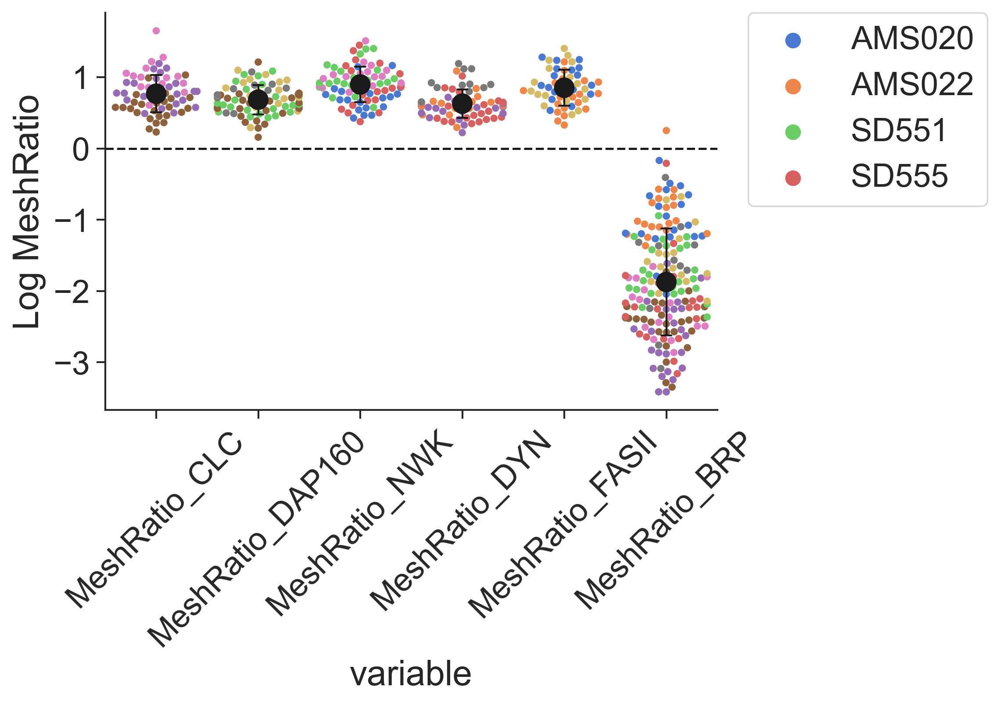

In [63]:
FIG = "Fig 2D_MeshRatioSwarm"
# Calculate log2 of all ratios
compRatio = agg.subset_data(CompMeshF_AZ, "Ratio")
LogRatio = np.log2(compRatio.loc[:, ["Ratio" in x for x in compRatio.columns]])
LogRatio[["Experiment", "Image"]]=compRatio.loc[:, ["Experiment", "Image"]]

# Calculate Image and Experiment level means for superplot
ImgMean = LogRatio.groupby(["Experiment", "Image"]).mean().reset_index()
ExpMean = LogRatio.groupby(["Experiment"]).mean().reset_index()

# Melt for plotting
ImgMean=ImgMean.melt(id_vars=["Experiment", "Image"], value_name="Log MeshRatio")
ExpMean=ExpMean.melt(id_vars=["Experiment"], value_name="Log MeshRatio")
# Make an ordering vector specific to the MeshRatio columns
ratio_order = ["MeshRatio_"+c for c in data_order] + ["MeshRatio_BRP"]

# Plot
sp = sns.swarmplot(data=ImgMean, x="variable", y="Log MeshRatio", hue="Experiment", size=4, order=ratio_order, zorder=0)
#sns.swarmplot(data=ExpMean, x="variable", y="Log MeshRatio", hue="Experiment", size=8, 
#              edgecolor="k", linewidth=1, order=ratio_order, zorder=0, ax=sp)

sns.pointplot(data=ImgMean, x="variable", y="Log MeshRatio",
              ci='sd', palette=['k'], scale=1.6,
              join=False, capsize=.1, errwidth=1, order=ratio_order, ax=sp)

handles, labels = sp.get_legend_handles_labels()
n = len(handles)//2

l = plt.legend(handles[0:n], labels[0:n], bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.xticks(rotation=45)
#sp.set_ylim(.4, 1.6)

# Draw horizontal dashed line at 0
ax1 = sp.axes
ax1.axhline(0, ls='--', color='k')

plt.savefig(os.path.join(savepath, FIG + ".svg"))
None

In [64]:
ImgMean = LogRatio.groupby(["Experiment", "Image"]).mean().reset_index().drop(["Experiment", "Image"], axis=1)
analysis = agg.compareGroups(ImgMean)
analysis['posthoc'].to_csv(os.path.join(statspath, f"{FIG}_Posthoc.csv"))

Performed Kruskal-Wallis: test statistic = 376.47433151520886 p-value:3.479490177584796e-79


## Fig 3 A-B Radial Profiles

**Load radial profile data and calculate normalized profiles**

In [65]:
FIG = "Fig 2B_RadialProfiles"
file_name = "Comp_ALLTHEPROFILES.csv"
netdata = agg.aggregate_csvs(root_dir, version_num, file_name)

profiles = agg.aggregate_csvs(root_dir, version_num, file_name)

# Filter out meshes near edge (EDMmean<7.5) & keep only AZ positive
profilesF = profiles.loc[profiles.EDMmean>=7.5, :]
profilesF = profilesF.loc[profilesF.AZcount>0, :]
channels = list(set([col.split(":")[0] for col in profilesF.columns if ":" in col]))

# Calculate per experiment average profiles
ExpMean = profilesF.groupby("Experiment").mean()
ExpMean = ExpMean.drop(["AZcount", "AZidtotal", "EDMmin", "EDMmean"], axis=1).reset_index()

# Normalize min-max to compare raw profiles to normalized ones
normprofilesF = profilesF.loc[:, ["Experiment", "AZidtotal"]]

for chan in channels:
    cols = [col for col in profilesF.columns if chan in col]
    temp = profilesF.loc[:, cols]
    min_vals = temp.min(axis=1)
    max_vals = temp.max(axis=1)
    temp = (temp.sub(min_vals, axis="index")).div((max_vals - min_vals), axis="index")
    normprofilesF[cols] = temp
    
# Calculate per experiment average normalized profiles
NormExpMean = normprofilesF.groupby("Experiment").mean()
NormExpMean = NormExpMean.drop(["AZidtotal"], axis=1).reset_index()

**Plot raw radial profiles**

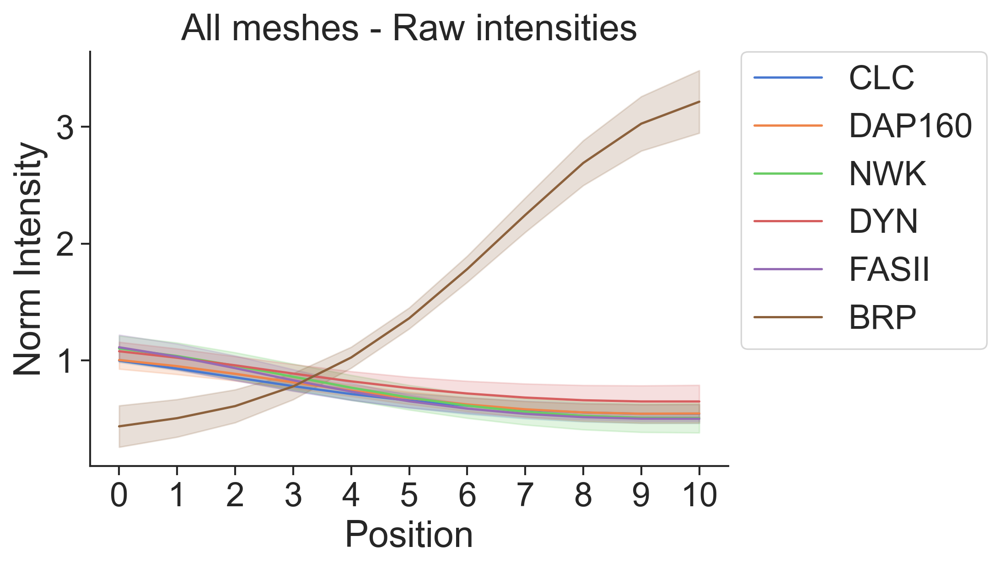

In [66]:
# Reformat raw data for plotting
ExpMeanMelt = ExpMean.melt(id_vars=["Experiment"], value_name="Norm Intensity")
ExpMeanMelt[['Channel', 'Position']] = ExpMeanMelt['variable'].str.split(":", expand=True)
ExpMeanMelt = ExpMeanMelt.drop("variable", axis=1)

lp = sns.lineplot(data=ExpMeanMelt, x="Position", y="Norm Intensity", hue="Channel", ci="sd", hue_order=data_order+["BRP"])
plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0)
plt.title("All meshes - Raw intensities")
plt.savefig(os.path.join(savepath, FIG + ".svg"))
None

**Plot normalized radial profiles**

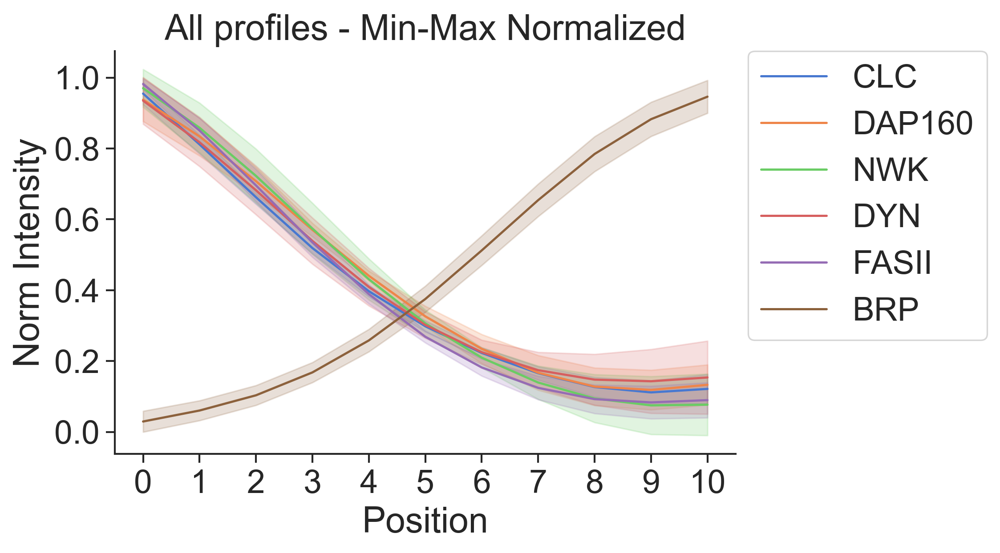

In [67]:
# Reformat normalized data for plotting
NormExpMelt = NormExpMean.melt(id_vars=["Experiment"], value_name="Norm Intensity")
NormExpMelt[['Channel', 'Position']] = NormExpMelt['variable'].str.split(":", expand=True)
NormExpMelt = NormExpMelt.drop("variable", axis=1)
                               
lp = sns.lineplot(data=NormExpMelt, x="Position", y="Norm Intensity", hue="Channel", ci="sd", hue_order=data_order+["BRP"])
plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0)
plt.title("All profiles - Min-Max Normalized")
#plt.savefig(os.path.join(savepath, "Fig 3_RadialProfiles_Norm.svg"))
None                        

**Plot individual comparison graphs**

No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


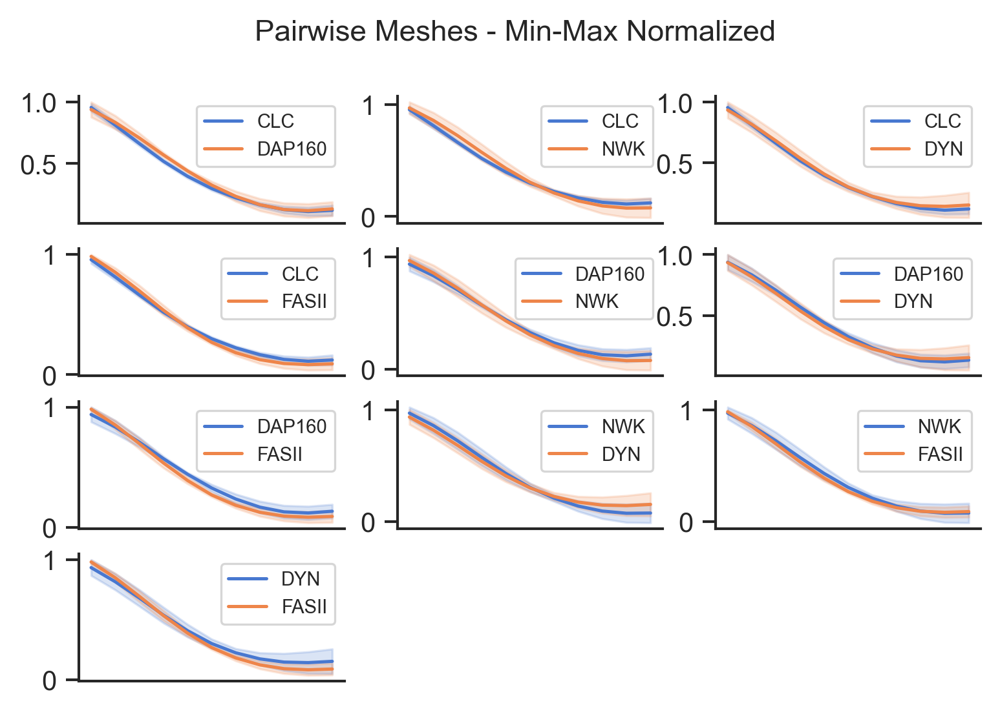

In [68]:
FIG = "Fig 2SA_NormRadialPairs"
rows, cols = 4,3
fig, axes = plt.subplots(rows, cols)
fig.suptitle("Pairwise Meshes - Min-Max Normalized", fontsize=11)
ax_i=0
for r, c1 in enumerate(data_order):
    for col, c2 in enumerate(data_order[r:]):
        if (c1 is not c2) & (ax_i<rows*cols):
            ax=axes[ax_i//cols, ax_i%cols]
            show = [c1, c2]
            sns.lineplot(data=NormExpMelt, x="Position", y="Norm Intensity", hue="Channel", 
                              ci="sd", hue_order=show, ax=ax)
            plt.legend(loc='upper right', borderaxespad=0)
            ax.set_ylabel("")
            ax.set_xlabel("")
            ax.tick_params(axis='x', bottom=False, labelbottom=False)
            ax.tick_params(axis='y', labelsize=10)
            ax.legend(fontsize=7)
            ax_i+=1
while ax_i < rows*cols:
    ax=axes[ax_i//cols, ax_i%cols]
    fig.delaxes(ax)
    ax_i+=1
plt.savefig(os.path.join(savepath, FIG + ".svg"))

## Fig 2E Spottiness

c:\Users\sdels\miniconda3\envs\defects\envs\segment_paz\envs\paz_analysis\lib\site-packages\seaborn\categorical.py:1296: UserWarning: 11.4% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
c:\Users\sdels\miniconda3\envs\defects\envs\segment_paz\envs\paz_analysis\lib\site-packages\seaborn\categorical.py:1296: UserWarning: 6.2% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
c:\Users\sdels\miniconda3\envs\defects\envs\segment_paz\envs\paz_analysis\lib\site-packages\seaborn\categorical.py:1296: UserWarning: 7.4% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


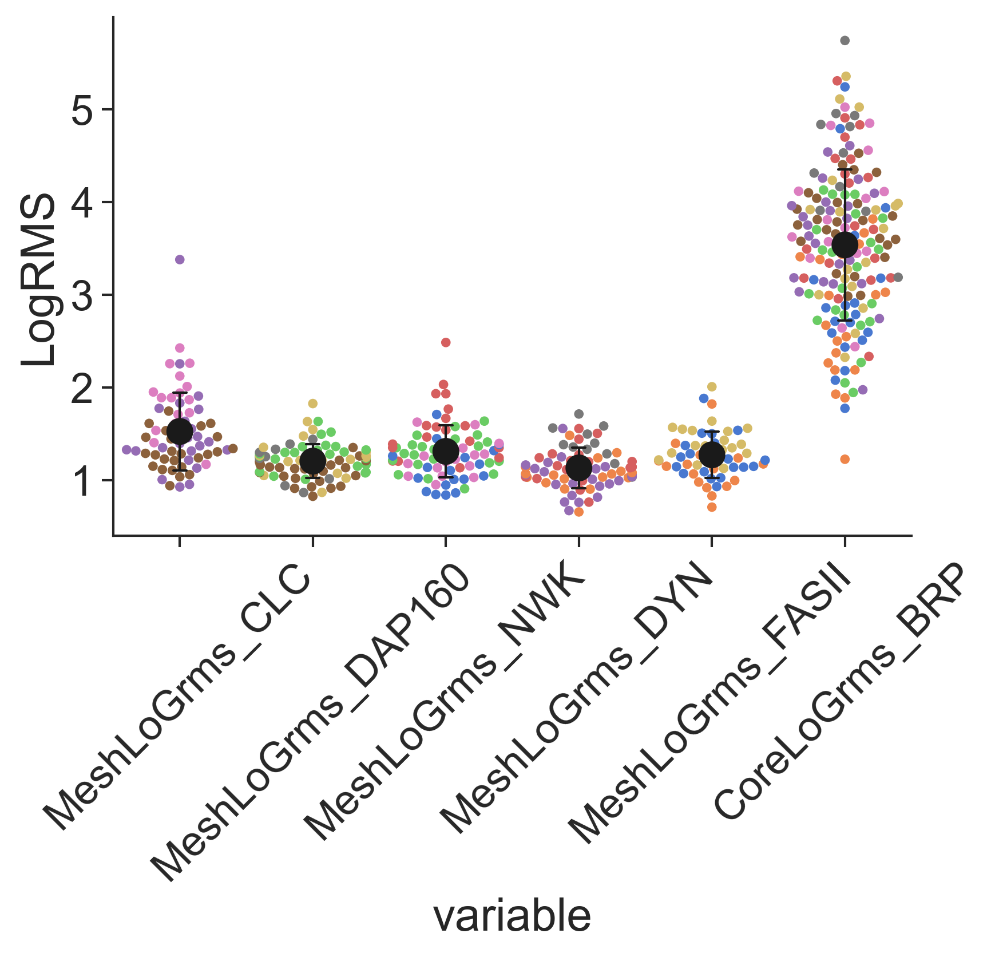

In [69]:
FIG = 'Fig 2E_Spotty'
# Subset spottiness measurements:
spotty = agg.subset_data(CompMeshF_AZ, "LoGrms")

# Make order vector for spottiness columns
spot_order = np.array([[f"CoreLoGrms_{chan}", f"MeshLoGrms_{chan}"] for chan in data_order]).flatten()

# Calculate Image and Experiment level means for superplot
ImgMean = spotty.groupby(["Experiment", "Image"]).mean().reset_index()
ExpMean =  spotty.groupby(["Experiment"]).mean().reset_index()

# Melt for plotting
ImgMean=ImgMean.melt(id_vars=["Experiment", "Image"], value_name="LogRMS")
ExpMean=ExpMean.melt(id_vars=["Experiment"], value_name="LogRMS")

# Make an ordering vector specific to the MeshRatio columns
spot_order = [f"MeshLoGrms_{c}" for c in data_order] + ["CoreLoGrms_BRP"]

# Plot
sp = sns.swarmplot(data=ImgMean, x="variable", y="LogRMS", hue="Experiment", size=4, order=spot_order, zorder=0)
#sns.swarmplot(data=ExpMean, x="variable", y="LogRMS", hue="Experiment", size=8, 
#              edgecolor="k", linewidth=1, order=spot_order, zorder=0, ax=sp)

sns.pointplot(data=ImgMean, x="variable", y="LogRMS",
              ci='sd', palette=['k'], scale=1.6,
              join=False, capsize=.1, errwidth=1, order=spot_order, ax=sp)

sp.get_legend().remove()
plt.xticks(rotation=45)
plt.savefig(os.path.join(savepath, FIG + ".svg"))
None

In [70]:
ImgMean = spotty.groupby(["Experiment", "Image"]).mean().reset_index().drop(["Experiment", "Image"], axis=1)
totest = ImgMean.loc[:, [f"MeshLoGrms_{c}" for c in data_order]]
analysis = agg.compareGroups(totest)
analysis['posthoc'].to_csv(os.path.join(statspath, FIG+"_Posthoc.csv"))

Performed Kruskal-Wallis: test statistic = 55.56784329494849 p-value:2.4702795702693178e-11


## Fig S2B Entropy

In [71]:
FIG = "Fig S2B_EntropyD4"
entropy = agg.subset_data(CompMeshF_AZ, "EntrD4")

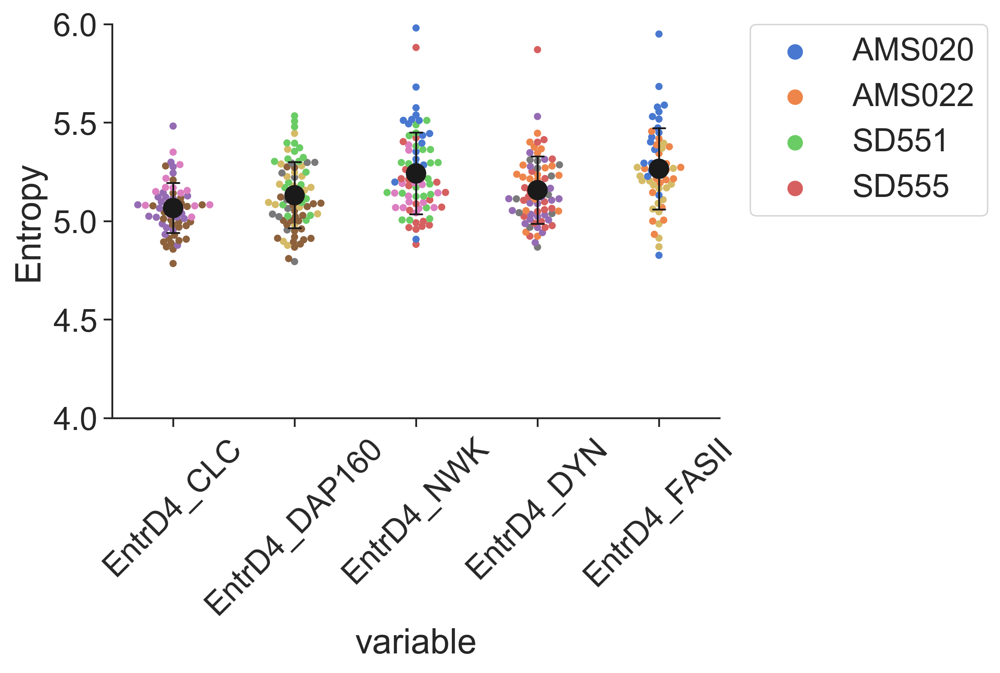

In [72]:
# Make order vector for spottiness columns
entropy_order = np.array([f"EntrD4_{chan}" for chan in data_order])

# Calculate Image and Experiment level means for superplot
ImgMean = entropy.groupby(["Experiment", "Image"]).mean().reset_index()
ExpMean = entropy.groupby(["Experiment"]).mean().reset_index()

# Melt for plotting
ImgMean=ImgMean.melt(id_vars=["Experiment", "Image"], value_name="Entropy")
ExpMean=ExpMean.melt(id_vars=["Experiment"], value_name="Entropy")

# Plot
sp = sns.swarmplot(data=ImgMean, x="variable", y="Entropy", hue="Experiment", size=4, order=entropy_order, zorder=0)
#sns.swarmplot(data=ExpMean, x="variable", y="Entropy", hue="Experiment", size=8, 
#              edgecolor="k", linewidth=1, order=entropy_order, zorder=0, ax=sp)

sns.pointplot(data=ImgMean, x="variable", y="Entropy",
              ci='sd', palette=['k'], scale=1.6,
              join=False, capsize=.1, errwidth=1, order=entropy_order, ax=sp)

handles, labels = sp.get_legend_handles_labels()
n = len(handles)//2

l = plt.legend(handles[0:n], labels[0:n], bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.ylim((4,6))
plt.xticks(rotation=45)
plt.savefig(os.path.join(savepath, FIG + ".svg"))
None

In [73]:
entropy = entropy.drop("EntrD4_BRP", axis=1)

In [74]:
ImgMean = entropy.groupby(["Experiment", "Image"]).mean().reset_index().drop(["Experiment", "Image"], axis=1)
analysis = agg.compareGroups(ImgMean)
analysis['posthoc'].to_csv(os.path.join(statspath, f"{FIG}_Posthoc.csv"))

Performed Kruskal-Wallis: test statistic = 46.90832210120279 p-value:1.5934558909836736e-09


# Figure 4 Graphs

## Fig S4A Intensity variances by channel

In [111]:
FIG = "Fig 4SA_Variances"
# Get data for single AZ containing meshes
Composite_1AZ = CompMeshF_AZ.loc[CompMeshF_AZ.AZcount==1, :]

# Collect core mean for BRP and mesh means for PAZ proteins to plot CV
# This is for single AZ containing meshes

# Normalize mean for AZidtotal

azcv = (Composite_1AZ.groupby(["Experiment", "Image"]).std()
        /Composite_1AZ.groupby(["Experiment", "Image"])
        .mean()).reset_index().loc[:, ["Experiment", "Image", "AZidtotal"]]

Composite_1AZ_MeshMeans = agg.subset_data(Composite_1AZ, "MeshMean", "BRP")
img_cvs = Composite_1AZ_MeshMeans.groupby(["Image", "Experiment"]).std().reset_index()
img_cvs["azcv"] = azcv.AZidtotal
img_cvs = img_cvs.melt(id_vars=["Image", "Experiment"], value_name="CV")


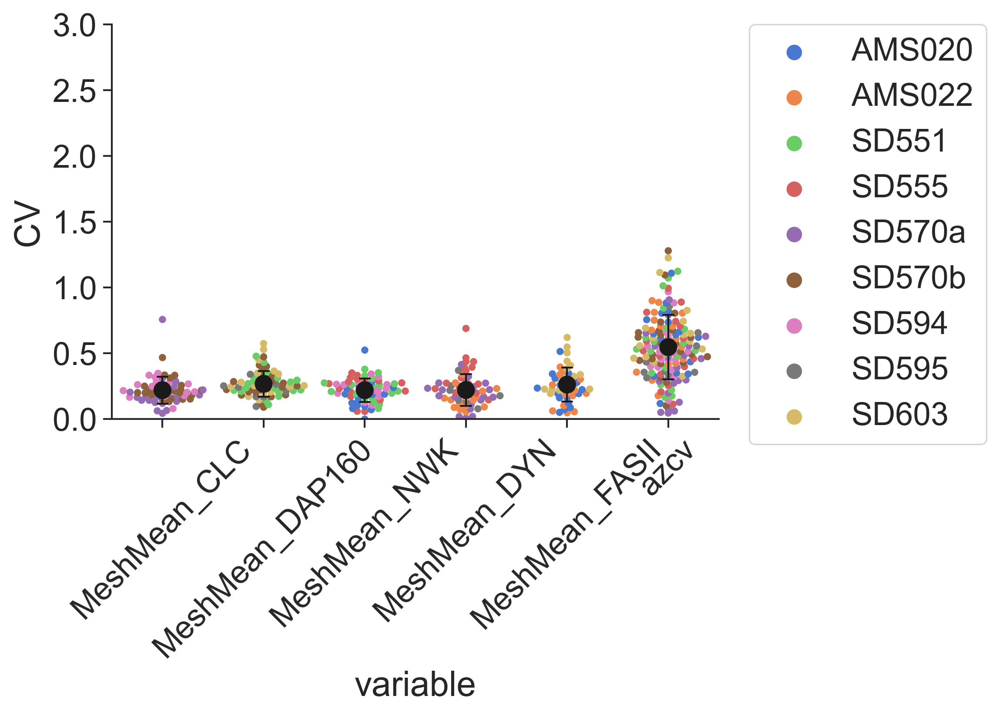

In [112]:

# Plot data
mean_order = ["MeshMean_"+c for c in data_order] + ["azcv"]
sp = sns.swarmplot(data=img_cvs, x="variable", y="CV", hue="Experiment", size=4, order=mean_order, zorder=0)
#sns.swarmplot(data=exp_means, x="variable", y="CV", hue="Experiment", 
#              size=9, edgecolor="k", linewidth=1, order=mean_order, zorder=0)
sns.pointplot(data=img_cvs, x="variable", y="CV",
              ci='sd', palette=['k'], scale=1.4,
              join=False, capsize=.1, errwidth=1, order=mean_order)
handles, labels = sp.get_legend_handles_labels()
#n = len(handles)//2
plt.ylim((0,3))
l = plt.legend(handles[0:], labels[0:], bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.xticks(rotation=45)
plt.savefig(os.path.join(savepath, FIG + ".svg"))
None

In [76]:
ImgMean = Composite_1AZ_MeshMeans.groupby(["Image", "Experiment"]).std().reset_index().drop(["Experiment", "Image"], axis=1)
analysis = agg.compareGroups(ImgMean)
analysis['posthoc'].to_csv(os.path.join(statspath, f"{FIG}-Posthoc.csv"))

Performed Kruskal-Wallis: test statistic = 97.39358337566341 p-value:1.8714314398502818e-19


## Fig 4B Intensity correlations/heatmap to AZ integrated density

**For additional code and analysis, see SD601h**

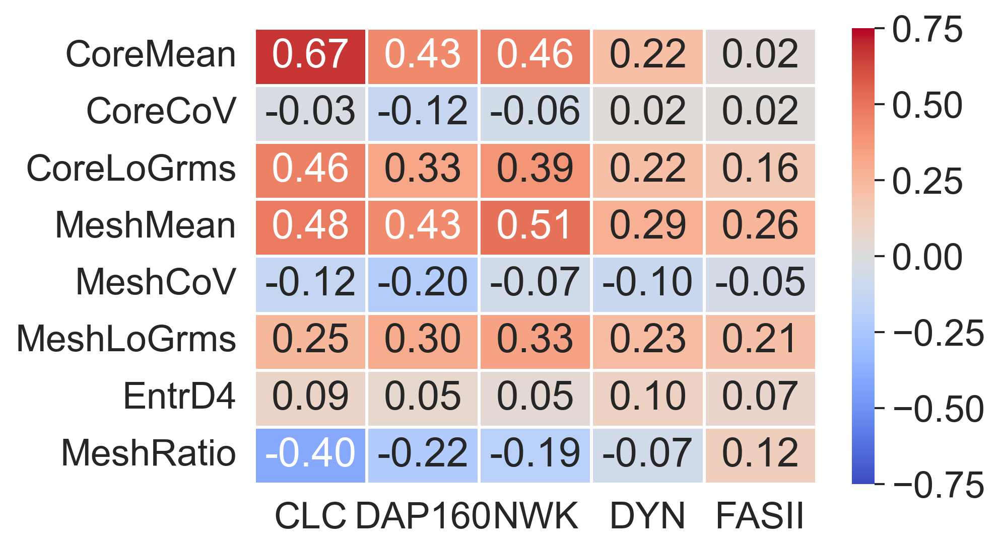

In [77]:
FIG = "Fig 4B_AZ-PAZmatrix"
# Define columns to analyze for this panel:
Intensity_cols = ["CoreMean", "CoreCoV", "CoreLoGrms", "MeshMean", "MeshCoV", "MeshLoGrms", "EntrD4", "MeshRatio"]

# Calculate Correlation matrix for single AZ containing meshes
PCC_matrix = Composite_1AZ.groupby("Experiment").corr()

# Isolate PCC to AZ idtotal
az_paz=pd.DataFrame()
az_paz["AZidPCC_avg"]=PCC_matrix.AZidtotal.groupby(level=1).mean()
az_paz["AZidPCC_sd"]=PCC_matrix.AZidtotal.groupby(level=1).std()
az_paz.to_csv(os.path.join(savepath, "Fig4_AZ-PAZ_PCC-idtotal_mean-stddev.csv"))

# Pivot to a nice table
PCCazid = PCC_matrix.AZidtotal.groupby(level=1).mean()
PCCazid.index=PCCazid.index.str.split("_", expand=True)
table=PCCazid.unstack().loc[Intensity_cols].drop(np.nan, axis=1)

# Reorder columns to match other graphs
table2=pd.DataFrame()
table2[data_order]=table.loc[:, data_order]
table2.to_csv(os.path.join(savepath, "AZ-PAZ_idtotal_table.csv"))

# Make heatmap
hm = sns.heatmap(data=table2, cmap='coolwarm', vmin=-.75, vmax=.75,
                 linewidth=1, center=0, annot=True, fmt='1.2f')
hm.tick_params(bottom=False, left=False)
plt.savefig(os.path.join(savepath, FIG + ".svg"))

In [78]:
PCCazid.to_csv(os.path.join(savepath, "TableS1.csv"))

## Fig S4B Scatterplots for selected comparisons

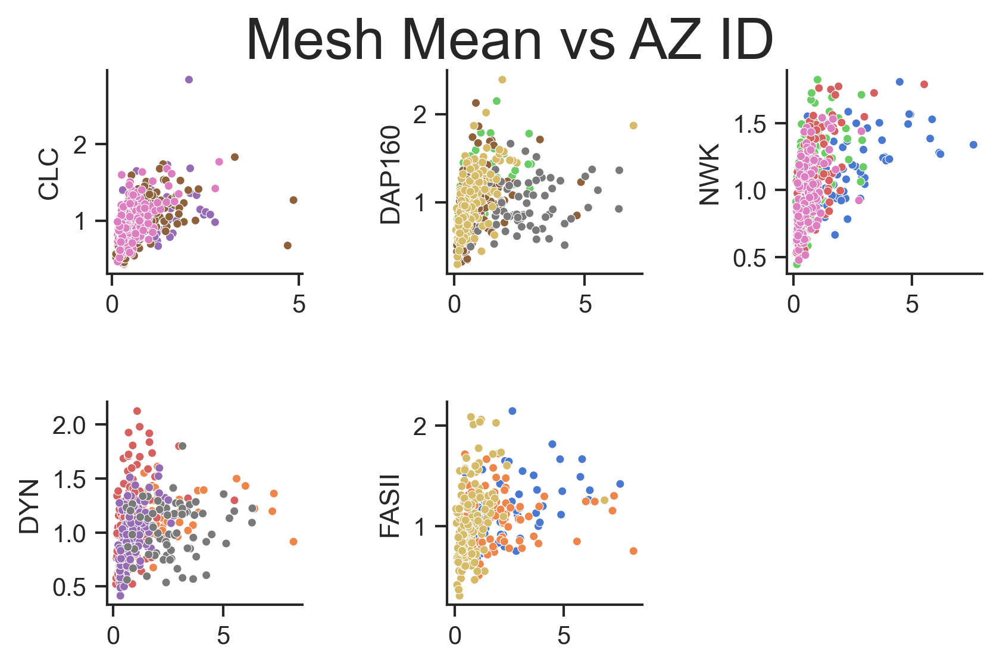

In [79]:
FIG = "Fig 4S-B_Scatterplots"
fig, axes = plt.subplots(2,3)
plt.tight_layout()
plt.suptitle("Mesh Mean vs AZ ID")
chans = ["CLC", "DAP160", "NWK", "DYN", "FASII"]
for r, row in enumerate(axes):
    for c, ax in enumerate(row):
        i=r*row.size+c
        if(i<len(chans)):
            sns.scatterplot(ax=ax, data=Composite_1AZ, x="AZidtotal", y=f"MeshMean_{chans[i]}", 
                       hue="Experiment", palette="muted", size=.5,
                      legend=False)
            ax.set_ylabel(chans[i], fontsize=11)
            ax.set_xlabel("")
            ax.tick_params(axis='x', labelsize=10)
            ax.tick_params(axis='y', labelsize=10)
        else: fig.delaxes(axes[r,c])
plt.savefig(os.path.join(savepath, FIG + ".svg"))

## Fig 4C-D high vs low AZid meshes

## Fig 4D mean mesh in high-lo

c:\Users\sdels\miniconda3\envs\defects\envs\segment_paz\envs\paz_analysis\lib\site-packages\seaborn\categorical.py:1296: UserWarning: 10.8% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
c:\Users\sdels\miniconda3\envs\defects\envs\segment_paz\envs\paz_analysis\lib\site-packages\seaborn\categorical.py:1296: UserWarning: 16.1% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
c:\Users\sdels\miniconda3\envs\defects\envs\segment_paz\envs\paz_analysis\lib\site-packages\seaborn\categorical.py:1296: UserWarning: 18.6% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
c:\Users\sdels\miniconda3\envs\defects\envs\segment_paz\envs\paz_analysis\lib\site-packages\seaborn\categorical.py:1296: UserWarning: 16.8% of the points cannot be placed; you may w

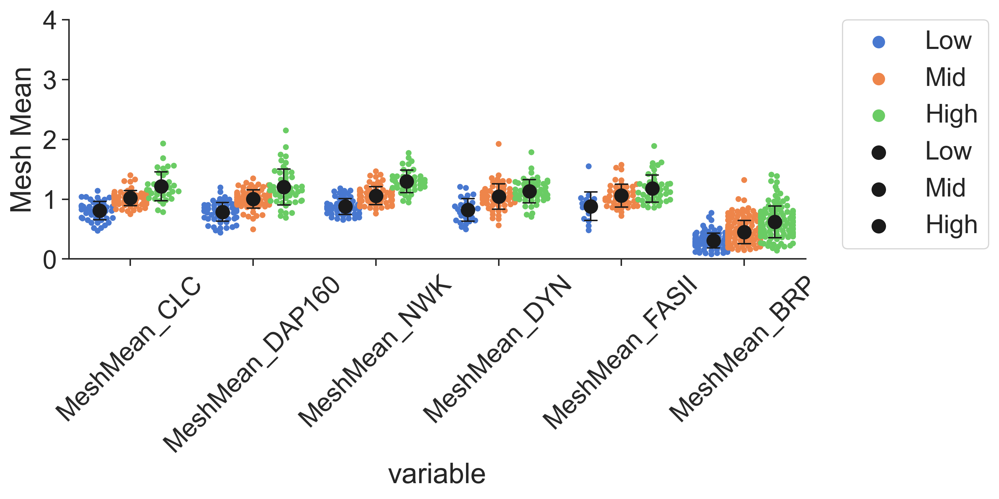

In [80]:
FIG = "Fig 4D_MeshMeanBinned"
# Make figure with binned AZid meshes
plt.figure(figsize=(9,3))
# Create a copy of the 1AZ filtered dataset and bin by AZ-id quantile
az1copy = Composite_1AZ.copy()
azid = az1copy.AZidtotal
az1copy["bins"]="Mid"
az1copy.bins.where(azid>azid.quantile(.25), "Low", inplace=True)
az1copy.bins.where(azid<azid.quantile(.75), "High", inplace=True)

# Subset Mesh Mean data
cols = ["Experiment", "Image", "bins"] + [f"MeshMean_{chan}" for chan in data_order] + ["MeshMean_BRP"]
data = az1copy.loc[:, cols]

# Prep data for graphing
ImgMean = data.groupby(["Experiment", "Image", "bins"]).mean().reset_index()
ExpMean = data.groupby(["Experiment", "bins"]).mean().reset_index()

ImgMean = ImgMean.melt(id_vars = ["Experiment", "Image", "bins"], value_name="Mesh Mean")
ExpMean = ExpMean.melt(id_vars = ["Experiment", "bins"], value_name="Mesh Mean")

# Plot data
sp = sns.swarmplot(data=ImgMean, x="variable", y="Mesh Mean", hue="bins", 
                   hue_order=["Low", "Mid", "High"], size=4, dodge=True, zorder=0)
sns.pointplot(data=ImgMean, x="variable", y="Mesh Mean",
              ci='sd', palette=['k'], scale=1.4,
              join=False, capsize=.1, errwidth=1, dodge=.5,
              hue="bins", hue_order=["Low", "Mid", "High"])
handles, labels = sp.get_legend_handles_labels()
n = len(handles)//2
l = plt.legend(handles[0:], labels[0:], bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.xticks(rotation=45)
plt.ylim((0,4))
plt.savefig(os.path.join(savepath, FIG + ".svg"))
None

In [81]:
# Stats for mesh mean
# Do a single anova or kw test for each channel
ImgMean = data.groupby(["Experiment", "Image", "bins"]).mean().reset_index().drop(["Experiment", "Image"], axis=1)
ImgMean = ImgMean.pivot(columns = 'bins', values=ImgMean.columns.drop('bins'))
ImgMean.columns.names=[None, None]
#ImgMean = ImgMean.reset_index(drop=True)
chans=list(set([col[0] for col in ImgMean]))
analyses = {chan:agg.compareGroups(ImgMean[chan]) for chan in chans}

all_posthocs = pd.concat({key:chan['posthoc'] for key,chan in analyses.items()})
all_posthocs.to_csv(os.path.join(statspath, f"{FIG}-Posthoc_ByChannel.csv"))

Performed Kruskal-Wallis: test statistic = 95.95825995935992 p-value:1.4552198271961035e-21
Performed Kruskal-Wallis: test statistic = 75.29326151473742 p-value:4.469675556398523e-17
Performed Kruskal-Wallis: test statistic = 32.8056273758545 p-value:7.522263244345003e-08
Performed Kruskal-Wallis: test statistic = 71.02636839104753 p-value:3.77415792797448e-16
Performed Kruskal-Wallis: test statistic = 20.136238761238758 p-value:4.2410296610571806e-05
Performed Kruskal-Wallis: test statistic = 84.20682849048728 p-value:5.1846509573504985e-19


## Fig 4C Core Mean binned

c:\Users\sdels\miniconda3\envs\defects\envs\segment_paz\envs\paz_analysis\lib\site-packages\seaborn\categorical.py:1296: UserWarning: 30.4% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
c:\Users\sdels\miniconda3\envs\defects\envs\segment_paz\envs\paz_analysis\lib\site-packages\seaborn\categorical.py:1296: UserWarning: 26.2% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
c:\Users\sdels\miniconda3\envs\defects\envs\segment_paz\envs\paz_analysis\lib\site-packages\seaborn\categorical.py:1296: UserWarning: 6.4% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
c:\Users\sdels\miniconda3\envs\defects\envs\segment_paz\envs\paz_analysis\lib\site-packages\seaborn\categorical.py:1296: UserWarning: 35.3% of the points cannot be placed; you may wa

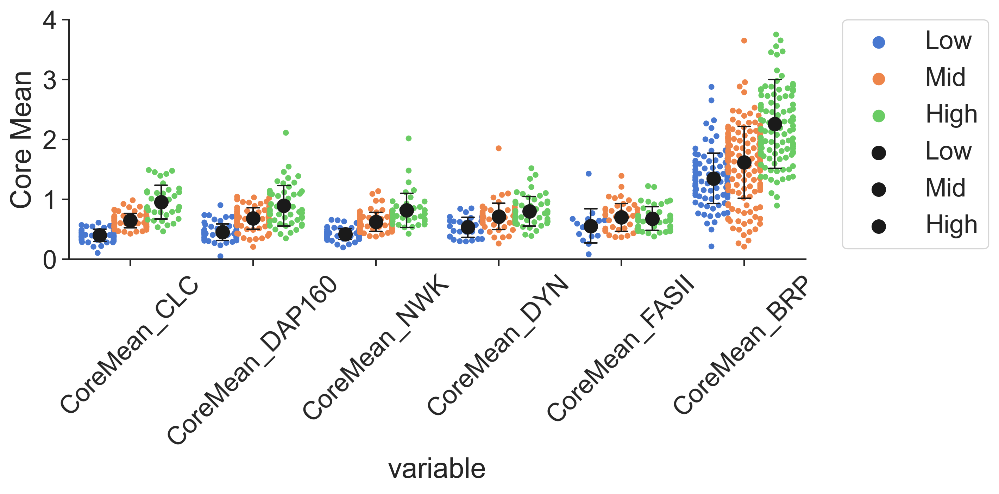

In [82]:
FIG = "Fig 4C_CoreMeanBinned"
# Make figure with binned AZid meshes
plt.figure(figsize=(9,3))

# Subset Mesh Mean data
cols = ["Experiment", "Image", "bins"] + [f"CoreMean_{chan}" for chan in data_order] + ["CoreMean_BRP"]
data = az1copy.loc[:, cols]

# Prep data for graphing
ImgMean = data.groupby(["Experiment", "Image", "bins"]).mean().reset_index()
ExpMean = data.groupby(["Experiment", "bins"]).mean().reset_index()

ImgMean = ImgMean.melt(id_vars = ["Experiment", "Image", "bins"], value_name="Core Mean")
ExpMean = ExpMean.melt(id_vars = ["Experiment", "bins"], value_name="Core Mean")

# Plot data
sp = sns.swarmplot(data=ImgMean, x="variable", y="Core Mean", hue="bins", 
                   hue_order=["Low", "Mid", "High"], size=4, dodge=True, zorder=0)
sns.pointplot(data=ImgMean, x="variable", y="Core Mean",
              ci='sd', palette=['k'], scale=1.4,
              join=False, capsize=.1, errwidth=1, dodge=.5,
              hue="bins", hue_order=["Low", "Mid", "High"])
handles, labels = sp.get_legend_handles_labels()
n = len(handles)//2
l = plt.legend(handles[0:], labels[0:], bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.xticks(rotation=45)
plt.ylim((0,4))
plt.savefig(os.path.join(savepath, FIG + ".svg"))
None

In [83]:
# Stats for core mean
# Do a single anova or kw test for each channel
ImgMean = data.groupby(["Experiment", "Image", "bins"]).mean().reset_index().drop(["Experiment", "Image"], axis=1)
ImgMean = ImgMean.pivot(columns = 'bins', values=ImgMean.columns.drop('bins'))
ImgMean.columns.names=[None, None]
#ImgMean = ImgMean.reset_index(drop=True)
chans=list(set([col[0] for col in ImgMean]))
analyses = {chan:agg.compareGroups(ImgMean[chan]) for chan in chans}

all_posthocs = pd.concat({key:chan['posthoc'] for key,chan in analyses.items()})
all_posthocs.to_csv(os.path.join(statspath, f"{FIG}-Posthoc_ByChannel.csv"))

Performed Kruskal-Wallis: test statistic = 86.41989101574052 p-value:1.7145853260943492e-19
Performed Kruskal-Wallis: test statistic = 22.34083150944491 p-value:1.4084780302664838e-05
Performed Kruskal-Wallis: test statistic = 102.09858634057218 p-value:6.754196183677376e-23
Performed Kruskal-Wallis: test statistic = 73.44100158264234 p-value:1.1284677020113948e-16
Performed Kruskal-Wallis: test statistic = 97.0913846777753 p-value:8.257977534285739e-22
Performed Kruskal-Wallis: test statistic = 5.514978771228812 p-value:0.06345086922065918


## Fig 4E Mesh Ratio by binned

c:\Users\sdels\miniconda3\envs\defects\envs\segment_paz\envs\paz_analysis\lib\site-packages\seaborn\categorical.py:1296: UserWarning: 18.6% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
c:\Users\sdels\miniconda3\envs\defects\envs\segment_paz\envs\paz_analysis\lib\site-packages\seaborn\categorical.py:1296: UserWarning: 24.8% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
c:\Users\sdels\miniconda3\envs\defects\envs\segment_paz\envs\paz_analysis\lib\site-packages\seaborn\categorical.py:1296: UserWarning: 13.6% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
c:\Users\sdels\miniconda3\envs\defects\envs\segment_paz\envs\paz_analysis\lib\site-packages\seaborn\categorical.py:1296: UserWarning: 28.4% of the points cannot be placed; you may w

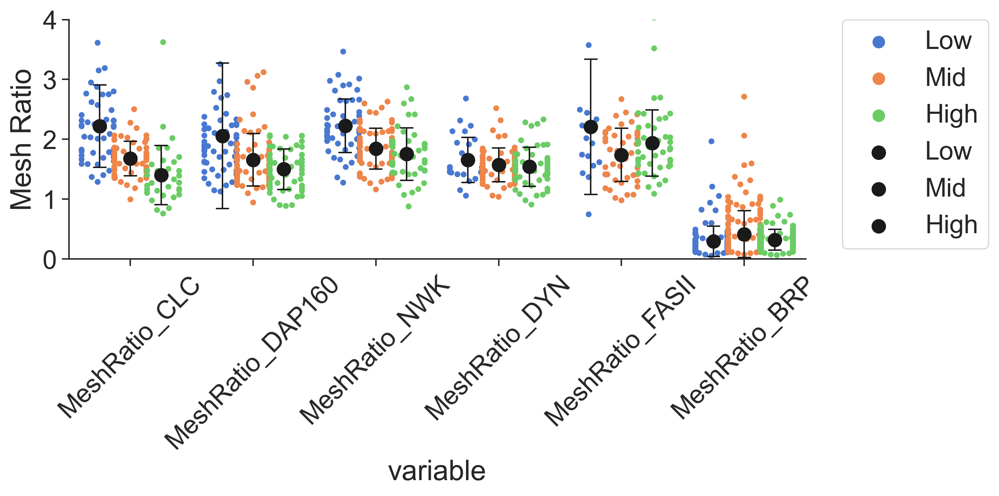

In [84]:
FIG = "Fig 4E-MeshRatioBinned"
# Make figure with binned AZid meshes
plt.figure(figsize=(9,3))

# Subset Mesh Ratio data
cols = ["Experiment", "Image", "bins"] + [f"MeshRatio_{chan}" for chan in data_order] + ["MeshRatio_BRP"]
data = az1copy.loc[:, cols]

# Prep data for graphing
ImgMean = data.groupby(["Experiment", "Image", "bins"]).mean().reset_index()
ExpMean = data.groupby(["Experiment", "bins"]).mean().reset_index()

ImgMean = ImgMean.melt(id_vars = ["Experiment", "Image", "bins"], value_name="Mesh Ratio")
ExpMean = ExpMean.melt(id_vars = ["Experiment", "bins"], value_name="Mesh Ratio")

# Plot data
sp = sns.swarmplot(data=ImgMean, x="variable", y="Mesh Ratio", hue="bins", 
                   hue_order=["Low", "Mid", "High"], size=4, dodge=True, zorder=0)
sns.pointplot(data=ImgMean, x="variable", y="Mesh Ratio",
              ci='sd', palette=['k'], scale=1.4,
              join=False, capsize=.1, errwidth=1, dodge=.5,
              hue="bins", hue_order=["Low", "Mid", "High"])
handles, labels = sp.get_legend_handles_labels()
n = len(handles)//2
l = plt.legend(handles[0:], labels[0:], bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.xticks(rotation=45)
plt.ylim((0,4))
plt.savefig(os.path.join(savepath, FIG + ".svg"))
None

In [85]:
# Do a single anova or kw test for each channel
ImgMean = data.groupby(["Experiment", "Image", "bins"]).mean().reset_index().drop(["Experiment", "Image"], axis=1)
ImgMean = ImgMean.pivot(columns = 'bins', values=ImgMean.columns.drop('bins'))
ImgMean.columns.names=[None, None]
#ImgMean = ImgMean.reset_index(drop=True)
chans=list(set([col[0] for col in ImgMean]))
analyses = {chan:agg.compareGroups(ImgMean[chan]) for chan in chans}

all_posthocs = pd.concat({key:chan['posthoc'] for key,chan in analyses.items()})
all_posthocs.to_csv(os.path.join(statspath, f"{FIG}-Posthoc_ByChannel.csv"))

Performed Kruskal-Wallis: test statistic = 52.876710868450175 p-value:3.295855208767334e-12
Performed Kruskal-Wallis: test statistic = 3.523851148851122 p-value:0.17171389738574155
Performed Kruskal-Wallis: test statistic = 30.9474664646998 p-value:1.9047721947285682e-07
Performed Kruskal-Wallis: test statistic = 0.6287900900674686 p-value:0.7302304972404077
Performed Kruskal-Wallis: test statistic = 25.003385988880837 p-value:3.7203493066871996e-06
Performed Kruskal-Wallis: test statistic = 6.968054773843505 p-value:0.03068358717911602
